# Generative Adversarial Networks (GANs)
So far in CS231N, all the applications of neural networks that we have explored have been **discriminative models** that take an input and are trained to produce a labeled output. This has ranged from straightforward classification of image categories to sentence generation (which was still phrased as a classification problem, our labels were in vocabulary space and we’d learned a recurrence to capture multi-word labels). In this notebook, we will expand our repetoire, and build **generative models** using neural networks. Specifically, we will learn how to build models which generate novel images that resemble a set of training images.

### What is a GAN?

In 2014, [Goodfellow et al.](https://arxiv.org/abs/1406.2661) presented a method for training generative models called Generative Adversarial Networks (GANs for short). In a GAN, we build two different neural networks. Our first network is a traditional classification network, called the **discriminator**. We will train the discriminator to take images, and classify them as being real (belonging to the training set) or fake (not present in the training set). Our other network, called the **generator**, will take random noise as input and transform it using a neural network to produce images. The goal of the generator is to fool the discriminator into thinking the images it produced are real.

We can think of this back and forth process of the generator ($G$) trying to fool the discriminator ($D$), and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $x \sim p_\text{data}$ are samples from the input data, $z \sim p(z)$ are the random noise samples, $G(z)$ are the generated images using the neural network generator $G$, and $D$ is the output of the discriminator, specifying the probability of an input being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

To optimize this minimax game, we will aternate between taking gradient *descent* steps on the objective for $G$, and gradient *ascent* steps on the objective for $D$:
1. update the **generator** ($G$) to minimize the probability of the __discriminator making the correct choice__. 
2. update the **discriminator** ($D$) to maximize the probability of the __discriminator making the correct choice__.

While these updates are useful for analysis, they do not perform well in practice. Instead, we will use a different objective when we update the generator: maximize the probability of the **discriminator making the incorrect choice**. This small change helps to allevaiate problems with the generator gradient vanishing when the discriminator is confident. This is the standard update used in most GAN papers, and was used in the original paper from [Goodfellow et al.](https://arxiv.org/abs/1406.2661). 

In this assignment, we will alternate the following updates:
1. Update the generator ($G$) to maximize the probability of the discriminator making the incorrect choice on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. Update the discriminator ($D$), to maximize the probability of the discriminator making the correct choice on real and generated data:
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$

### What else is there?
Since 2014, GANs have exploded into a huge research area, with massive [workshops](https://sites.google.com/site/nips2016adversarial/), and [hundreds of new papers](https://github.com/hindupuravinash/the-gan-zoo). Compared to other approaches for generative models, they often produce the highest quality samples but are some of the most difficult and finicky models to train (see [this github repo](https://github.com/soumith/ganhacks) that contains a set of 17 hacks that are useful for getting models working). Improving the stabiilty and robustness of GAN training is an open research question, with new papers coming out every day! For a more recent tutorial on GANs, see [here](https://arxiv.org/abs/1701.00160). There is also some even more recent exciting work that changes the objective function to Wasserstein distance and yields much more stable results across model architectures: [WGAN](https://arxiv.org/abs/1701.07875), [WGAN-GP](https://arxiv.org/abs/1704.00028).


GANs are not the only way to train a generative model! For other approaches to generative modeling check out the [deep generative model chapter](http://www.deeplearningbook.org/contents/generative_models.html) of the Deep Learning [book](http://www.deeplearningbook.org). Another popular way of training neural networks as generative models is Variational Autoencoders (co-discovered [here](https://arxiv.org/abs/1312.6114) and [here](https://arxiv.org/abs/1401.4082)). Variational autoencoders combine neural networks with variational inference to train deep generative models. These models tend to be far more stable and easier to train but currently don't produce samples that are as pretty as GANs.

Example pictures of what you should expect (yours might look slightly different):

![caption](gan_outputs_tf.png)


## Setup

In [1]:
import tensorflow as tf
import numpy as np
import os

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# A bunch of utility functions

def show_images(images):
    images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def count_params(model):
    """Count the number of parameters in the current TensorFlow graph """
    param_count = np.sum([np.prod(p.shape) for p in model.weights])
    return param_count

answers = np.load('gan-checks-tf.npz')

NOISE_DIM = 96

In [2]:
gpus = tf.config.experimental.list_physical_devices('GPU')
tf.config.experimental.set_memory_growth(gpus[0], True)

## Dataset
 GANs are notoriously finicky with hyperparameters, and also require many training epochs. In order to make this assignment approachable without a GPU, we will be working on the MNIST dataset, which is 60,000 training and 10,000 test images. Each picture contains a centered image of white digit on black background (0 through 9). This was one of the first datasets used to train convolutional neural networks and it is fairly easy -- a standard CNN model can easily exceed 99% accuracy. 
 

**Heads-up**: Our MNIST wrapper returns images as vectors. That is, they're size (batch, 784). If you want to treat them as images, we have to resize them to (batch,28,28) or (batch,28,28,1). They are also type np.float32 and bounded [0,1]. 

In [3]:
class MNIST(object):
    def __init__(self, batch_size, shuffle=False):
        """
        Construct an iterator object over the MNIST data
        
        Inputs:
        - batch_size: Integer giving number of elements per minibatch
        - shuffle: (optional) Boolean, whether to shuffle the data on each epoch
        """
        train, _ = tf.keras.datasets.mnist.load_data()
        X, y = train
        X = X.astype(np.float32)/255
        X = X.reshape((X.shape[0], -1))
        self.X, self.y = X, y
        self.batch_size, self.shuffle = batch_size, shuffle

    def __iter__(self):
        N, B = self.X.shape[0], self.batch_size
        idxs = np.arange(N)
        if self.shuffle:
            np.random.shuffle(idxs)
        return iter((self.X[i:i+B], self.y[i:i+B]) for i in range(0, N, B)) 

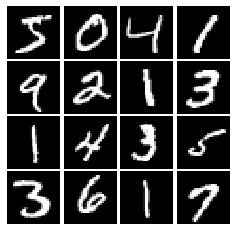

In [4]:
# show a batch
mnist = MNIST(batch_size=16) 
show_images(mnist.X[:16])

## LeakyReLU
In the cell below, you should implement a LeakyReLU. See the [class notes](http://cs231n.github.io/neural-networks-1/) (where alpha is small number) or equation (3) in [this paper](http://ai.stanford.edu/~amaas/papers/relu_hybrid_icml2013_final.pdf). LeakyReLUs keep ReLU units from dying and are often used in GAN methods (as are maxout units, however those increase model size and therefore are not used in this notebook).

HINT: You should be able to use `tf.maximum`

In [5]:
def leaky_relu(x, alpha=0.01):
    """Compute the leaky ReLU activation function.
    
    Inputs:
    - x: TensorFlow Tensor with arbitrary shape
    - alpha: leak parameter for leaky ReLU
    
    Returns:
    TensorFlow Tensor with the same shape as x
    """
    # TODO: implement leaky ReLU
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    relu = tf.maximum(x, alpha * x)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    
    return relu

Test your leaky ReLU implementation. You should get errors < 1e-10

In [6]:
def test_leaky_relu(x, y_true):
    y = leaky_relu(tf.constant(x))
    print('Maximum error: %g'%rel_error(y_true, y))

test_leaky_relu(answers['lrelu_x'], answers['lrelu_y'])

Maximum error: 0


## Random Noise
Generate a TensorFlow `Tensor` containing uniform noise from -1 to 1 with shape `[batch_size, dim]`.

In [7]:
def sample_noise(batch_size, dim):
    """Generate random uniform noise from -1 to 1.
    
    Inputs:
    - batch_size: integer giving the batch size of noise to generate
    - dim: integer giving the dimension of the noise to generate
    
    Returns:
    TensorFlow Tensor containing uniform noise in [-1, 1] with shape [batch_size, dim]
    """
    # TODO: sample and return noise
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    noise = tf.random.uniform([batch_size, dim], minval=-1, maxval=1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    
    return noise


Make sure noise is the correct shape and type:

In [8]:
def test_sample_noise():
    batch_size = 3
    dim = 4
    z = sample_noise(batch_size, dim)
    # Check z has the correct shape
    assert z.get_shape().as_list() == [batch_size, dim]
    # Make sure z is a Tensor and not a numpy array
    assert isinstance(z, tf.Tensor)
    # Check that we get different noise for different evaluations
    z1 = sample_noise(batch_size, dim)
    z2 = sample_noise(batch_size, dim)
    assert not np.array_equal(z1, z2)
    # Check that we get the correct range
    assert np.all(z1 >= -1.0) and np.all(z1 <= 1.0)
    print("All tests passed!")
    
test_sample_noise()

All tests passed!


## Discriminator
Our first step is to build a discriminator. **Hint:** You should use the layers in `tf.keras.layers` to build the model.
All fully connected layers should include bias terms. For initialization, just use the default initializer used by the `tf.keras.layers` functions.

Architecture:
 * Fully connected layer with input size 784 and output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 1 
 
The output of the discriminator should thus have shape `[batch_size, 1]`, and contain real numbers corresponding to the scores that each of the `batch_size` inputs is a real image.

In [9]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    from tensorflow.keras import layers
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        layers.Dense(256, input_shape=(784,),activation=leaky_relu),
        layers.Dense(256, activation=leaky_relu),
        layers.Dense(1)
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the discriminator is correct:

In [10]:
def test_discriminator(true_count=267009):
    model = discriminator()
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in discriminator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in discriminator.')
        
test_discriminator()

Correct number of parameters in discriminator.


## Generator
Now to build a generator. You should use the layers in `tf.keras.layers` to construct the model. All fully connected layers should include bias terms. Note that you can use the tf.nn module to access activation functions. Once again, use the default initializers for parameters.

Architecture:
 * Fully connected layer with inupt size tf.shape(z)[1] (the number of noise dimensions) and output size 1024
 * `ReLU`
 * Fully connected layer with output size 1024 
 * `ReLU`
 * Fully connected layer with output size 784
 * `TanH` (To restrict every element of the output to be in the range [-1,1])

In [11]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    from tensorflow.keras import layers
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        layers.Dense(1024, input_shape=(noise_dim,), activation='relu'),
        layers.Dense(1024, activation='relu'),
        layers.Dense(784, activation='tanh')
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the generator is correct:

In [12]:
def test_generator(true_count=1858320):
    model = generator(4)
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in generator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in generator.')
        
test_generator()

Correct number of parameters in generator.


# GAN Loss

Compute the generator and discriminator loss. The generator loss is:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: Use [tf.ones](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/ones) and [tf.zeros](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/zeros) to generate labels for your discriminator. Use [tf.keras.losses.BinaryCrossentropy](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/losses/BinaryCrossentropy) to help compute your loss function.

In [13]:
def discriminator_loss(logits_real, logits_fake):
    """
    Computes the discriminator loss described above.
    
    Inputs:
    - logits_real: Tensor of shape (N, 1) giving scores for the real data.
    - logits_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Returns:
    - loss: Tensor containing (scalar) the loss for the discriminator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    
    real = tf.ones(logits_real.shape)
    fake = tf.zeros(logits_fake.shape)
    bce = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    
    real_loss = bce(real, logits_real)
    fake_loss = bce(fake, logits_fake)
    
    loss = real_loss + fake_loss

    
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def generator_loss(logits_fake):
    """
    Computes the generator loss described above.

    Inputs:
    - logits_fake: PyTorch Tensor of shape (N,) giving scores for the fake data.
    
    Returns:
    - loss: PyTorch Tensor containing the (scalar) loss for the generator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    
    fake = tf.ones(logits_fake.shape)
    
    bce = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    loss = bce(fake, logits_fake)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your GAN loss. Make sure both the generator and discriminator loss are correct. You should see errors less than 1e-8.

In [14]:
def test_discriminator_loss(logits_real, logits_fake, d_loss_true):
    d_loss = discriminator_loss(tf.constant(logits_real),
                                tf.constant(logits_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))

test_discriminator_loss(answers['logits_real'], answers['logits_fake'],
                        answers['d_loss_true'])

Maximum error in d_loss: 3.97058e-09


In [15]:
def test_generator_loss(logits_fake, g_loss_true):
    g_loss = generator_loss(tf.constant(logits_fake))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_generator_loss(answers['logits_fake'], answers['g_loss_true'])

Maximum error in g_loss: 4.4518e-09


# Optimizing our loss
Make an `Adam` optimizer with a 1e-3 learning rate, beta1=0.5 to mininize G_loss and D_loss separately. The trick of decreasing beta was shown to be effective in helping GANs converge in the [Improved Techniques for Training GANs](https://arxiv.org/abs/1606.03498) paper. In fact, with our current hyperparameters, if you set beta1 to the Tensorflow default of 0.9, there's a good chance your discriminator loss will go to zero and the generator will fail to learn entirely. In fact, this is a common failure mode in GANs; if your D(x) learns too fast (e.g. loss goes near zero), your G(z) is never able to learn. Often D(x) is trained with SGD with Momentum or RMSProp instead of Adam, but here we'll use Adam for both D(x) and G(z). 

In [16]:
# TODO: create an AdamOptimizer for D_solver and G_solver
def get_solvers(learning_rate=1e-3, beta1=0.5):
    """Create solvers for GAN training.
    
    Inputs:
    - learning_rate: learning rate to use for both solvers
    - beta1: beta1 parameter for both solvers (first moment decay)
    
    Returns:
    - D_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    - G_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    """
    D_solver = None
    G_solver = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    D_solver = tf.keras.optimizers.Adam(learning_rate = learning_rate,beta_1 = beta1)
    G_solver = tf.keras.optimizers.Adam(learning_rate = learning_rate,beta_1 = beta1)
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return D_solver, G_solver

# Training a GAN!
Well that wasn't so hard, was it? After the first epoch, you should see fuzzy outlines, clear shapes as you approach epoch 3, and decent shapes, about half of which will be sharp and clearly recognizable as we pass epoch 5. In our case, we'll simply train D(x) and G(z) with one batch each every iteration. However, papers often experiment with different schedules of training D(x) and G(z), sometimes doing one for more steps than the other, or even training each one until the loss gets "good enough" and then switching to training the other. 

In [17]:
# a giant helper function
def run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=96):
    """Train a GAN for a certain number of epochs.
    
    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_solver: an Optimizer for Discriminator
    - G_solver: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)
    
    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x
                logits_real = D(preprocess_img(real_data))

                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)
                logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))

                d_total_error = discriminator_loss(logits_real, logits_fake)
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)      
                D_solver.apply_gradients(zip(d_gradients, D.trainable_variables))
            
            with tf.GradientTape() as tape:
                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)

                gen_logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                g_error = generator_loss(gen_logits_fake)
                g_gradients = tape.gradient(g_error, G.trainable_variables)      
                G_solver.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1
    
    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

#### Train your GAN! This should take about 10 minutes on a CPU, or about 2 minutes on GPU.

Epoch: 0, Iter: 0, D: 1.237, G:0.7114
Instructions for updating:
Use tf.identity instead.


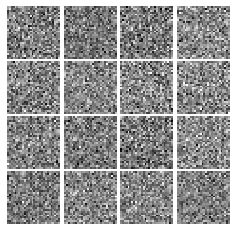

Epoch: 0, Iter: 20, D: 0.603, G:0.9223


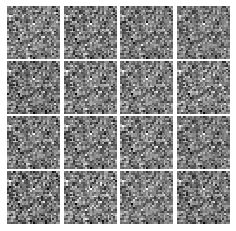

Epoch: 0, Iter: 40, D: 0.6349, G:1.115


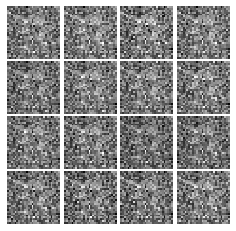

Epoch: 0, Iter: 60, D: 1.299, G:1.369


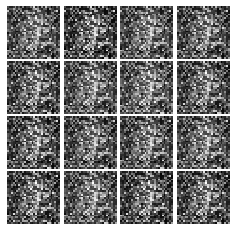

Epoch: 0, Iter: 80, D: 1.336, G:0.7435


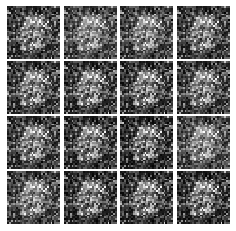

Epoch: 0, Iter: 100, D: 0.9459, G:1.49


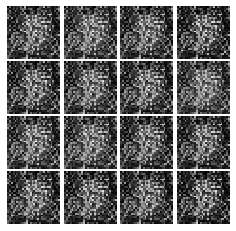

Epoch: 0, Iter: 120, D: 1.256, G:1.156


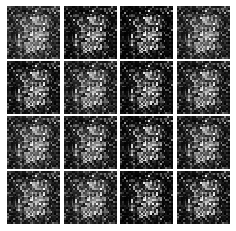

Epoch: 0, Iter: 140, D: 1.28, G:1.079


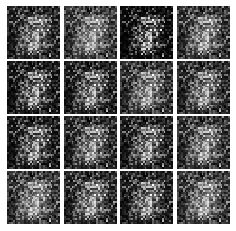

Epoch: 0, Iter: 160, D: 1.395, G:1.095


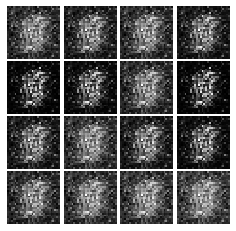

Epoch: 0, Iter: 180, D: 1.191, G:1.466


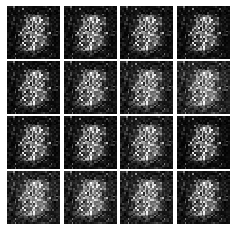

Epoch: 0, Iter: 200, D: 1.438, G:0.9886


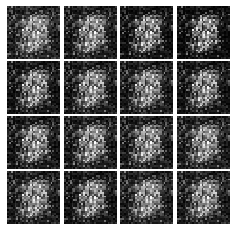

Epoch: 0, Iter: 220, D: 1.057, G:2.484


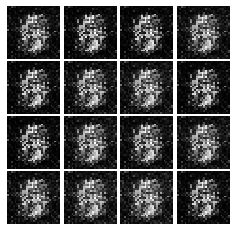

Epoch: 0, Iter: 240, D: 1.141, G:1.869


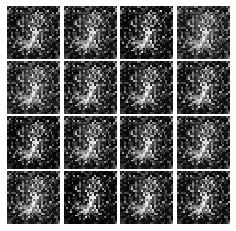

Epoch: 0, Iter: 260, D: 1.287, G:1.463


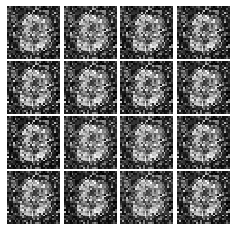

Epoch: 0, Iter: 280, D: 0.9957, G:1.552


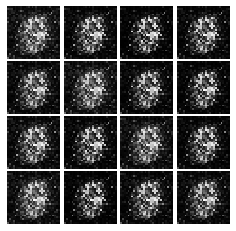

Epoch: 0, Iter: 300, D: 1.502, G:0.9472


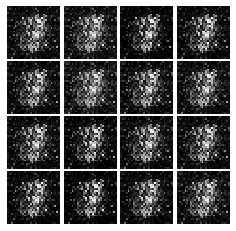

Epoch: 0, Iter: 320, D: 1.064, G:1.388


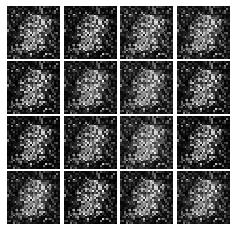

Epoch: 0, Iter: 340, D: 1.316, G:1.013


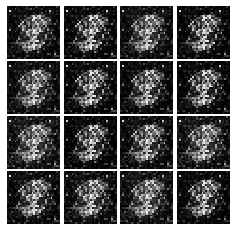

Epoch: 0, Iter: 360, D: 2.733, G:0.7349


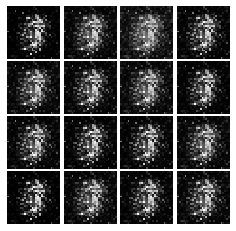

Epoch: 0, Iter: 380, D: 1.152, G:3.154


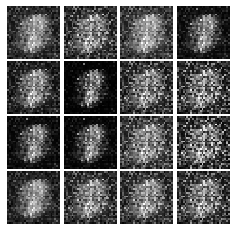

Epoch: 0, Iter: 400, D: 1.017, G:1.19


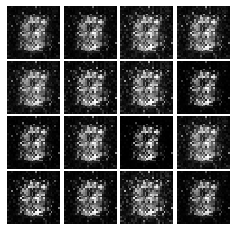

Epoch: 0, Iter: 420, D: 1.403, G:1.073


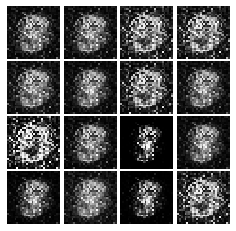

Epoch: 0, Iter: 440, D: 1.144, G:1.14


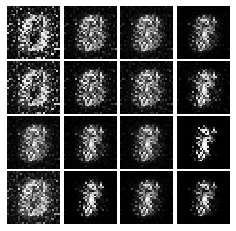

Epoch: 0, Iter: 460, D: 1.407, G:0.9301


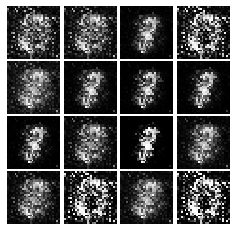

Epoch: 1, Iter: 480, D: 1.134, G:1.156


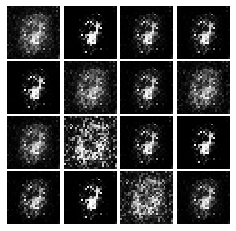

Epoch: 1, Iter: 500, D: 1.134, G:1.927


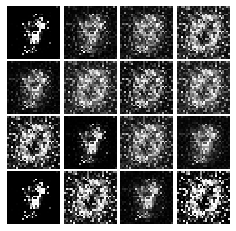

Epoch: 1, Iter: 520, D: 0.7622, G:1.808


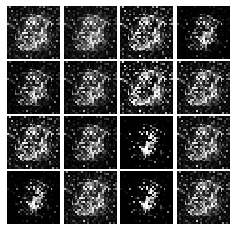

Epoch: 1, Iter: 540, D: 1.045, G:2.154


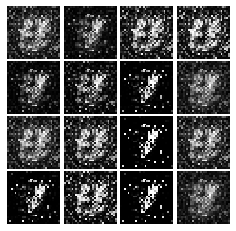

Epoch: 1, Iter: 560, D: 0.8106, G:1.288


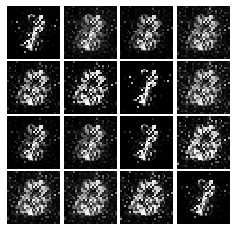

Epoch: 1, Iter: 580, D: 0.9846, G:1.695


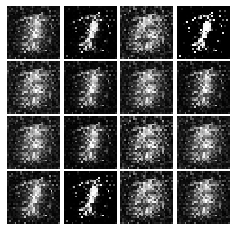

Epoch: 1, Iter: 600, D: 1.09, G:1.378


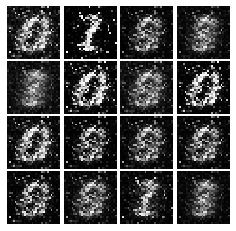

Epoch: 1, Iter: 620, D: 1.097, G:1.95


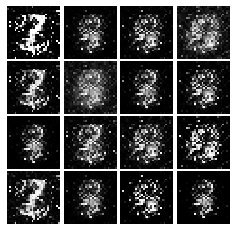

Epoch: 1, Iter: 640, D: 0.8638, G:1.506


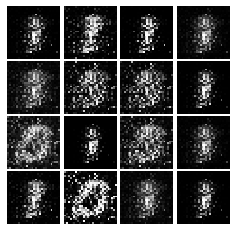

Epoch: 1, Iter: 660, D: 1.099, G:1.789


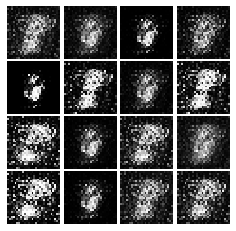

Epoch: 1, Iter: 680, D: 0.9729, G:1.143


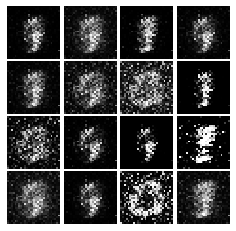

Epoch: 1, Iter: 700, D: 0.9268, G:2.913


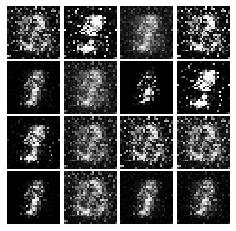

Epoch: 1, Iter: 720, D: 1.029, G:2.284


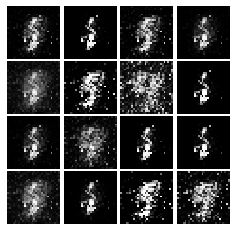

Epoch: 1, Iter: 740, D: 0.9349, G:2.303


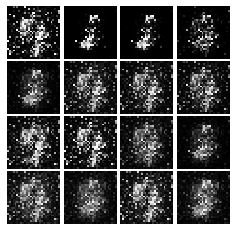

Epoch: 1, Iter: 760, D: 1.054, G:1.182


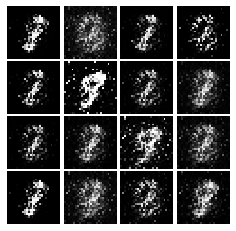

Epoch: 1, Iter: 780, D: 1.602, G:1.596


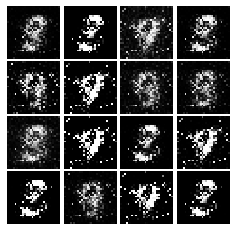

Epoch: 1, Iter: 800, D: 1.555, G:1.064


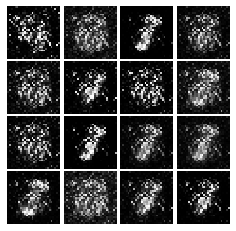

Epoch: 1, Iter: 820, D: 1.181, G:1.345


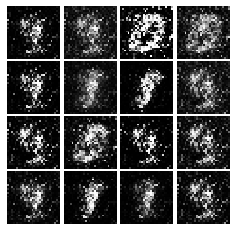

Epoch: 1, Iter: 840, D: 1.099, G:2.558


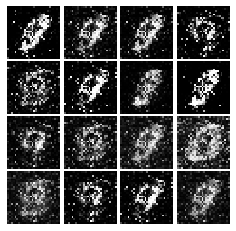

Epoch: 1, Iter: 860, D: 1.343, G:1.299


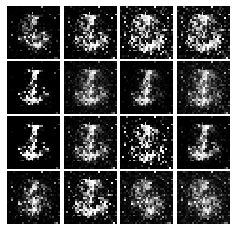

Epoch: 1, Iter: 880, D: 1.098, G:1.317


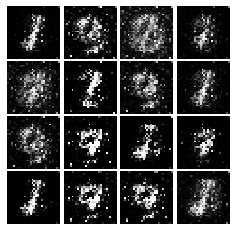

Epoch: 1, Iter: 900, D: 1.364, G:0.422


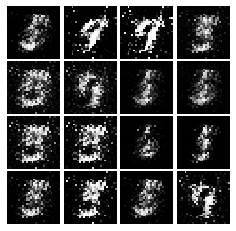

Epoch: 1, Iter: 920, D: 1.215, G:0.885


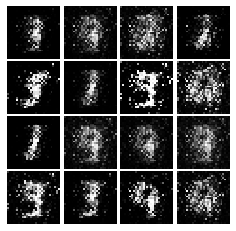

Epoch: 2, Iter: 940, D: 1.325, G:0.6682


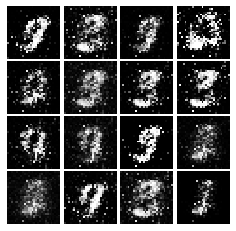

Epoch: 2, Iter: 960, D: 1.034, G:1.214


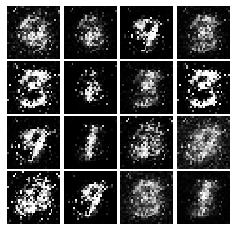

Epoch: 2, Iter: 980, D: 1.135, G:1.303


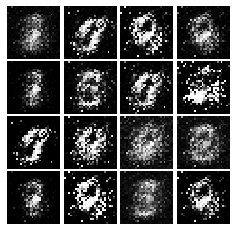

Epoch: 2, Iter: 1000, D: 1.269, G:1.247


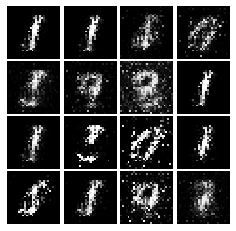

Epoch: 2, Iter: 1020, D: 1.079, G:1.155


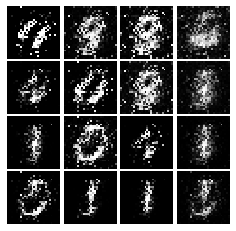

Epoch: 2, Iter: 1040, D: 1.202, G:1.371


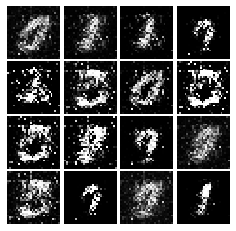

Epoch: 2, Iter: 1060, D: 1.231, G:1.769


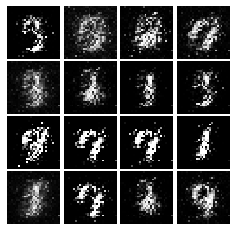

Epoch: 2, Iter: 1080, D: 1.756, G:1.052


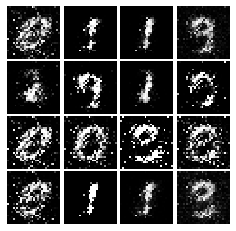

Epoch: 2, Iter: 1100, D: 1.177, G:1.088


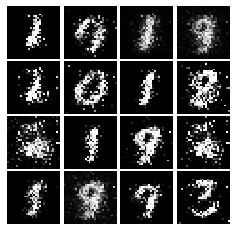

Epoch: 2, Iter: 1120, D: 1.173, G:1.467


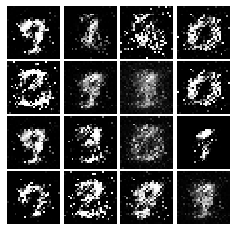

Epoch: 2, Iter: 1140, D: 0.9814, G:2.662


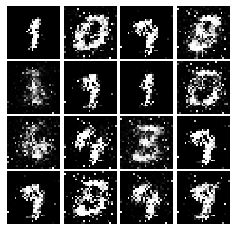

Epoch: 2, Iter: 1160, D: 1.233, G:1.328


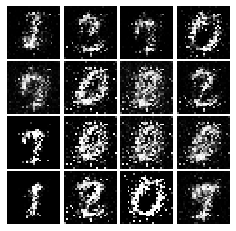

Epoch: 2, Iter: 1180, D: 1.316, G:0.4765


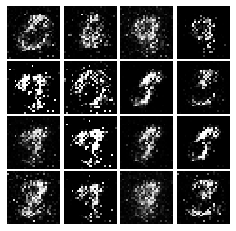

Epoch: 2, Iter: 1200, D: 1.194, G:1.155


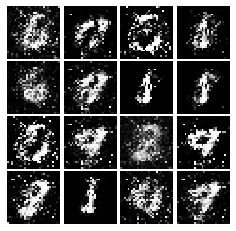

Epoch: 2, Iter: 1220, D: 1.23, G:1.164


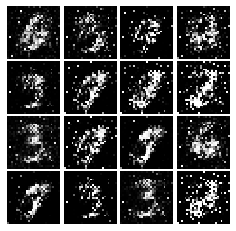

Epoch: 2, Iter: 1240, D: 1.131, G:1.045


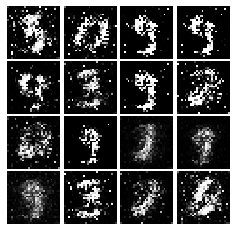

Epoch: 2, Iter: 1260, D: 1.393, G:0.8951


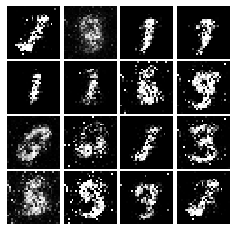

Epoch: 2, Iter: 1280, D: 1.276, G:0.957


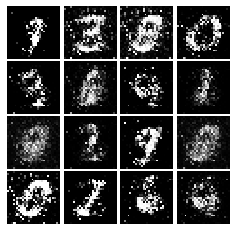

Epoch: 2, Iter: 1300, D: 1.138, G:0.8575


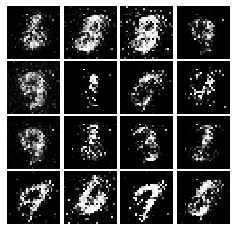

Epoch: 2, Iter: 1320, D: 1.393, G:0.9955


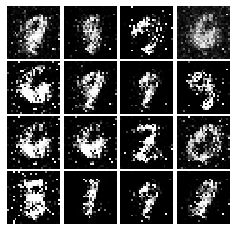

Epoch: 2, Iter: 1340, D: 1.308, G:0.8255


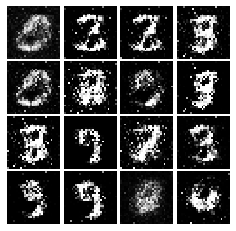

Epoch: 2, Iter: 1360, D: 1.383, G:0.8397


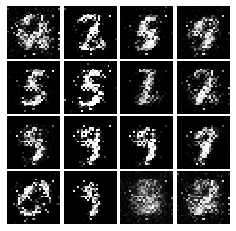

Epoch: 2, Iter: 1380, D: 1.074, G:1.142


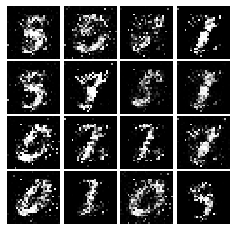

Epoch: 2, Iter: 1400, D: 1.228, G:1.037


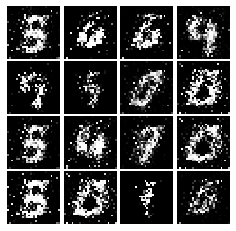

Epoch: 3, Iter: 1420, D: 2.207, G:0.7012


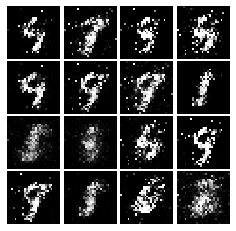

Epoch: 3, Iter: 1440, D: 1.097, G:1.158


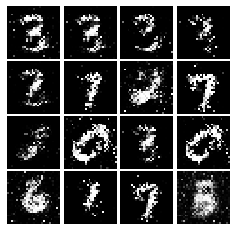

Epoch: 3, Iter: 1460, D: 1.18, G:1.076


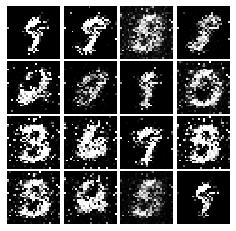

Epoch: 3, Iter: 1480, D: 1.053, G:1.165


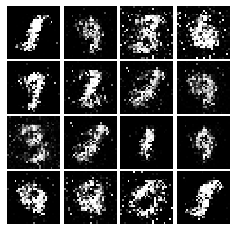

Epoch: 3, Iter: 1500, D: 1.276, G:1.562


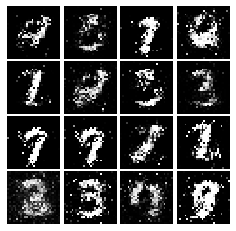

Epoch: 3, Iter: 1520, D: 1.219, G:0.9108


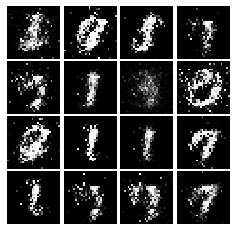

Epoch: 3, Iter: 1540, D: 1.271, G:1.024


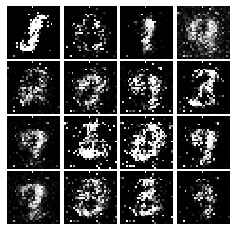

Epoch: 3, Iter: 1560, D: 1.27, G:0.8808


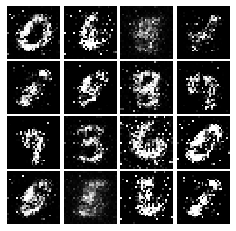

Epoch: 3, Iter: 1580, D: 1.24, G:1.614


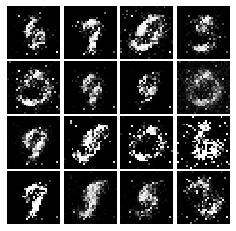

Epoch: 3, Iter: 1600, D: 1.329, G:0.9183


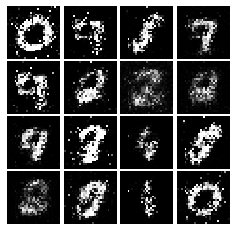

Epoch: 3, Iter: 1620, D: 1.11, G:1.025


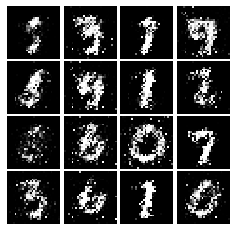

Epoch: 3, Iter: 1640, D: 1.22, G:1.01


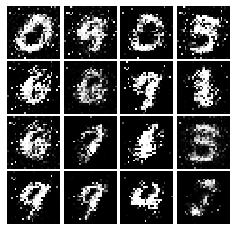

Epoch: 3, Iter: 1660, D: 1.073, G:1.108


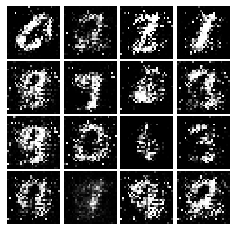

Epoch: 3, Iter: 1680, D: 1.216, G:0.9774


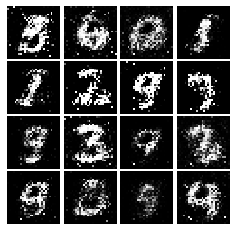

Epoch: 3, Iter: 1700, D: 1.434, G:0.6157


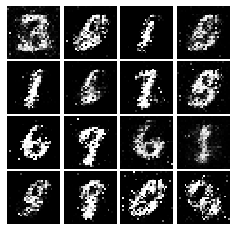

Epoch: 3, Iter: 1720, D: 1.326, G:1.169


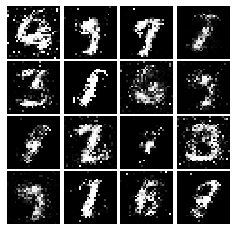

Epoch: 3, Iter: 1740, D: 1.239, G:1.005


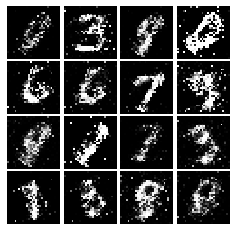

Epoch: 3, Iter: 1760, D: 1.081, G:0.9283


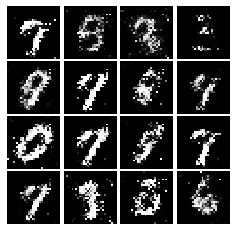

Epoch: 3, Iter: 1780, D: 1.135, G:1.04


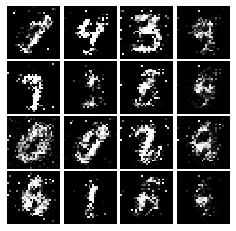

Epoch: 3, Iter: 1800, D: 1.281, G:0.9567


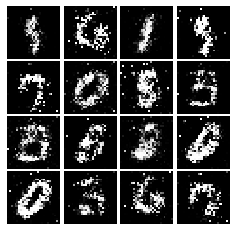

Epoch: 3, Iter: 1820, D: 1.352, G:0.9637


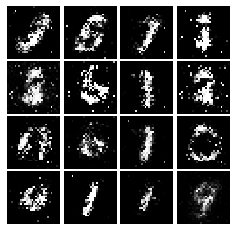

Epoch: 3, Iter: 1840, D: 1.329, G:0.823


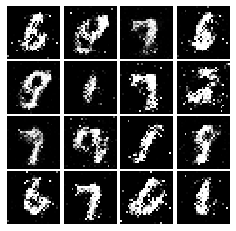

Epoch: 3, Iter: 1860, D: 1.208, G:1.182


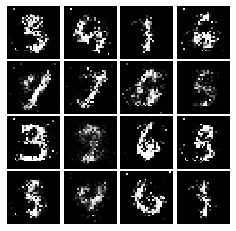

Epoch: 4, Iter: 1880, D: 1.396, G:0.9012


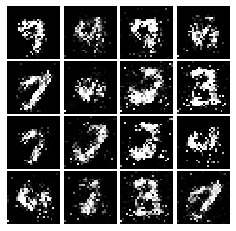

Epoch: 4, Iter: 1900, D: 1.372, G:0.9337


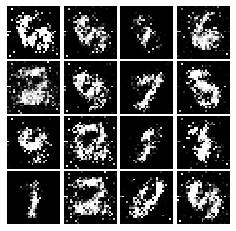

Epoch: 4, Iter: 1920, D: 1.292, G:0.9752


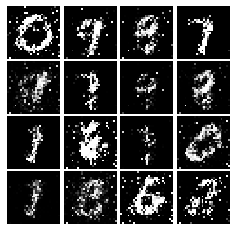

Epoch: 4, Iter: 1940, D: 1.392, G:0.8557


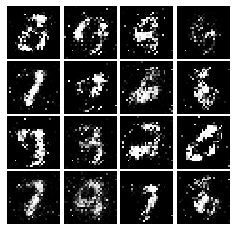

Epoch: 4, Iter: 1960, D: 1.244, G:0.9308


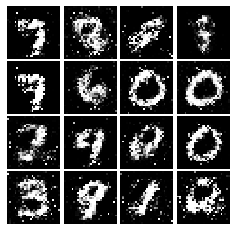

Epoch: 4, Iter: 1980, D: 1.208, G:0.9153


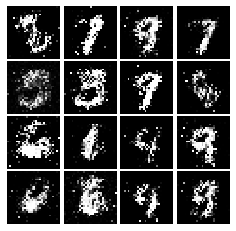

Epoch: 4, Iter: 2000, D: 1.385, G:0.8199


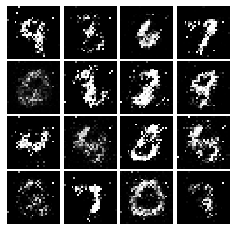

Epoch: 4, Iter: 2020, D: 1.281, G:0.843


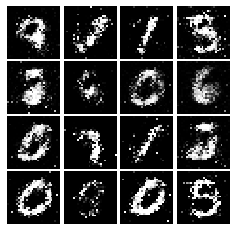

Epoch: 4, Iter: 2040, D: 1.305, G:0.9771


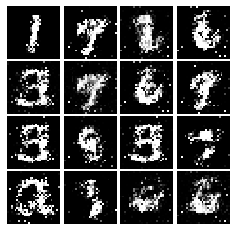

Epoch: 4, Iter: 2060, D: 1.34, G:0.8218


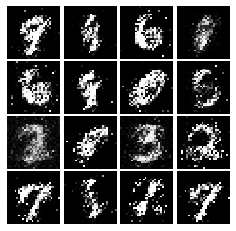

Epoch: 4, Iter: 2080, D: 1.377, G:0.8464


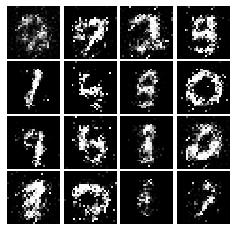

Epoch: 4, Iter: 2100, D: 1.386, G:0.9054


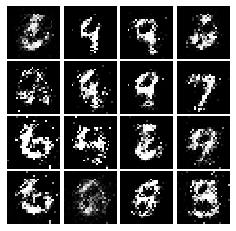

Epoch: 4, Iter: 2120, D: 1.359, G:0.8568


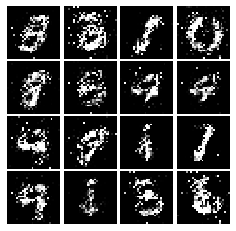

Epoch: 4, Iter: 2140, D: 1.266, G:0.7078


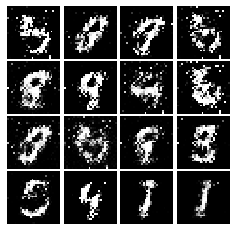

Epoch: 4, Iter: 2160, D: 1.358, G:0.8661


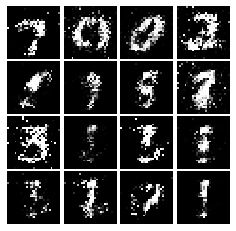

Epoch: 4, Iter: 2180, D: 1.302, G:0.922


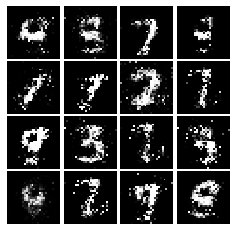

Epoch: 4, Iter: 2200, D: 1.271, G:1.025


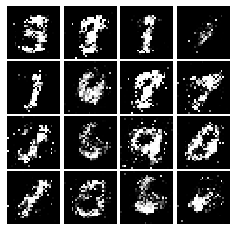

Epoch: 4, Iter: 2220, D: 1.333, G:0.9596


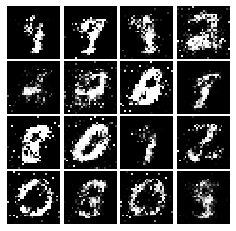

Epoch: 4, Iter: 2240, D: 1.224, G:0.8369


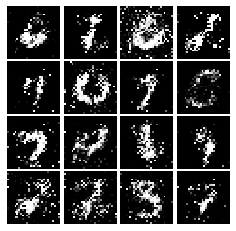

Epoch: 4, Iter: 2260, D: 1.256, G:0.8607


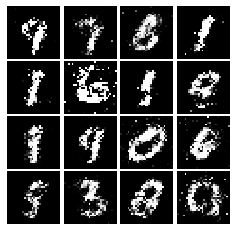

Epoch: 4, Iter: 2280, D: 1.323, G:0.817


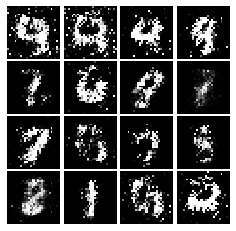

Epoch: 4, Iter: 2300, D: 1.232, G:0.9115


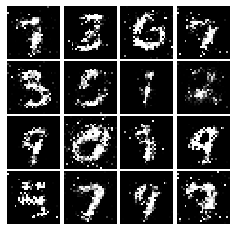

Epoch: 4, Iter: 2320, D: 1.206, G:1.116


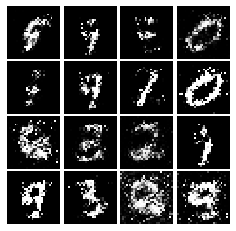

Epoch: 4, Iter: 2340, D: 1.279, G:0.7046


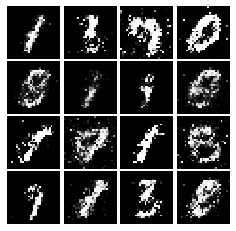

Epoch: 5, Iter: 2360, D: 1.208, G:0.748


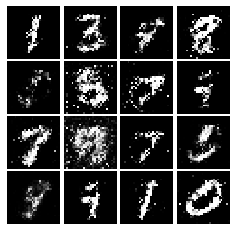

Epoch: 5, Iter: 2380, D: 1.318, G:0.8196


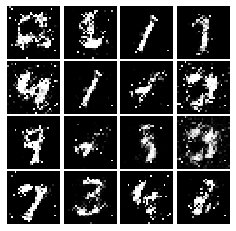

Epoch: 5, Iter: 2400, D: 1.221, G:0.9591


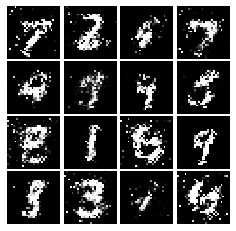

Epoch: 5, Iter: 2420, D: 1.164, G:0.9437


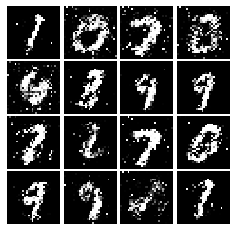

Epoch: 5, Iter: 2440, D: 1.261, G:1.158


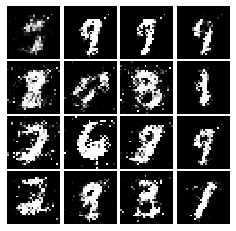

Epoch: 5, Iter: 2460, D: 1.219, G:0.9088


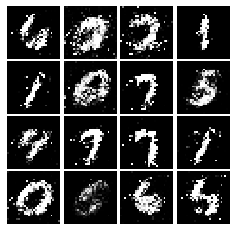

Epoch: 5, Iter: 2480, D: 1.239, G:0.7382


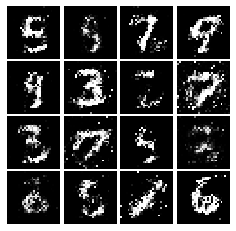

Epoch: 5, Iter: 2500, D: 1.096, G:0.9554


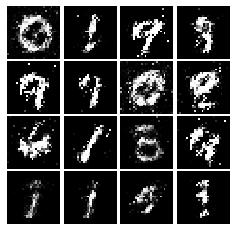

Epoch: 5, Iter: 2520, D: 1.459, G:0.8701


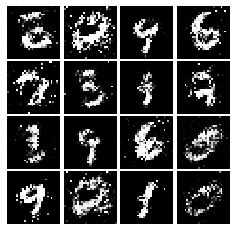

Epoch: 5, Iter: 2540, D: 1.421, G:0.952


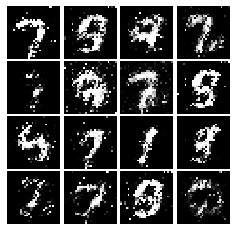

Epoch: 5, Iter: 2560, D: 1.426, G:0.9033


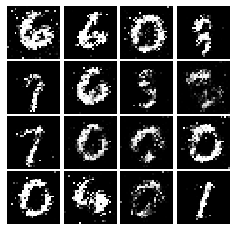

Epoch: 5, Iter: 2580, D: 1.293, G:0.4924


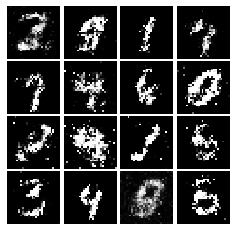

Epoch: 5, Iter: 2600, D: 1.444, G:0.7748


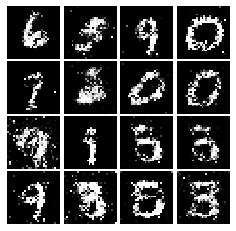

Epoch: 5, Iter: 2620, D: 1.271, G:0.8367


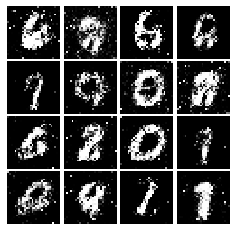

Epoch: 5, Iter: 2640, D: 1.285, G:1.108


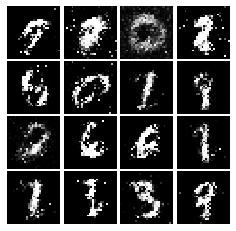

Epoch: 5, Iter: 2660, D: 1.245, G:0.9337


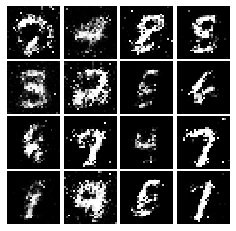

Epoch: 5, Iter: 2680, D: 1.388, G:0.5819


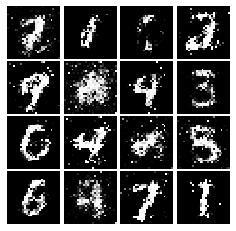

Epoch: 5, Iter: 2700, D: 1.325, G:0.7785


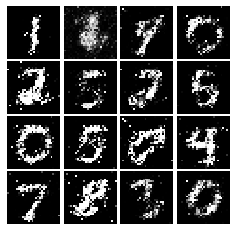

Epoch: 5, Iter: 2720, D: 1.335, G:0.796


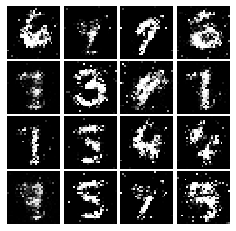

Epoch: 5, Iter: 2740, D: 1.36, G:0.7318


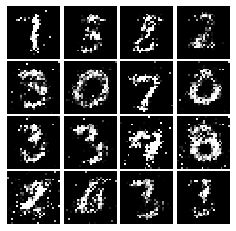

Epoch: 5, Iter: 2760, D: 1.355, G:0.8779


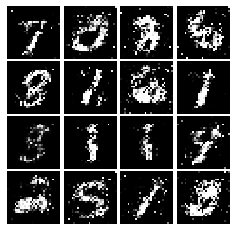

Epoch: 5, Iter: 2780, D: 1.321, G:0.8172


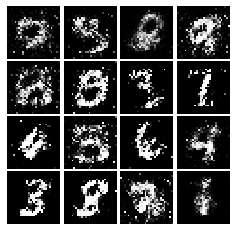

Epoch: 5, Iter: 2800, D: 1.238, G:0.8718


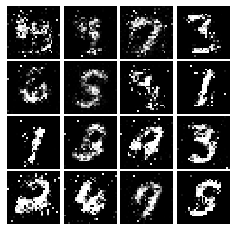

Epoch: 6, Iter: 2820, D: 1.346, G:0.8716


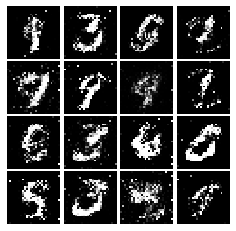

Epoch: 6, Iter: 2840, D: 1.411, G:0.6831


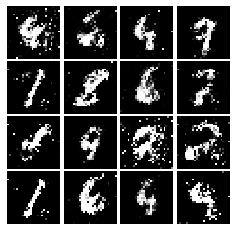

Epoch: 6, Iter: 2860, D: 1.291, G:0.8443


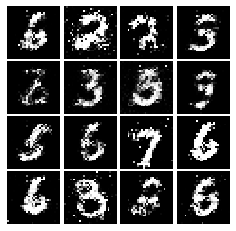

Epoch: 6, Iter: 2880, D: 1.25, G:0.8566


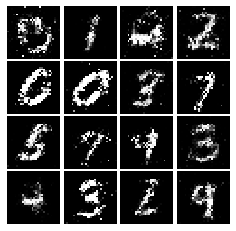

Epoch: 6, Iter: 2900, D: 1.371, G:0.8915


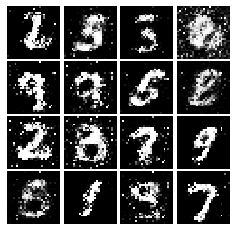

Epoch: 6, Iter: 2920, D: 1.422, G:0.7108


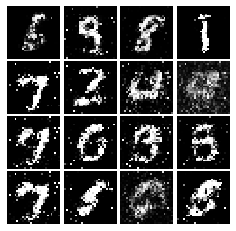

Epoch: 6, Iter: 2940, D: 1.329, G:0.8111


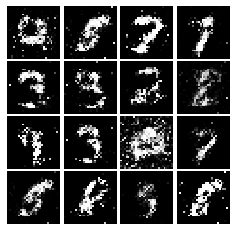

Epoch: 6, Iter: 2960, D: 1.319, G:0.8439


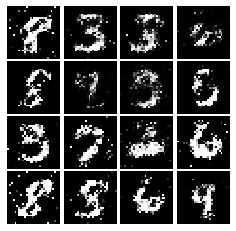

Epoch: 6, Iter: 2980, D: 1.416, G:0.8115


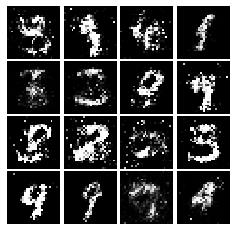

Epoch: 6, Iter: 3000, D: 1.321, G:0.8458


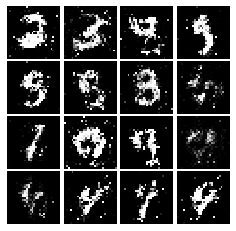

Epoch: 6, Iter: 3020, D: 1.263, G:0.8836


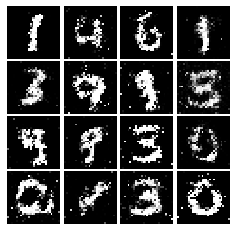

Epoch: 6, Iter: 3040, D: 1.31, G:0.9144


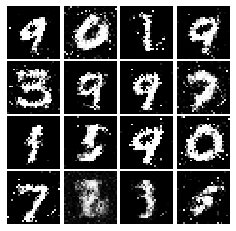

Epoch: 6, Iter: 3060, D: 1.366, G:0.742


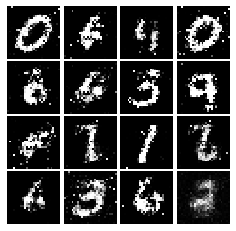

Epoch: 6, Iter: 3080, D: 1.276, G:0.8488


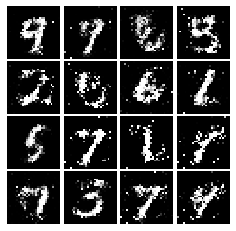

Epoch: 6, Iter: 3100, D: 1.221, G:0.8138


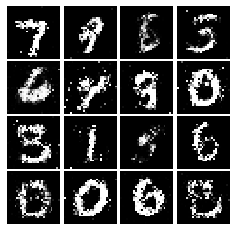

Epoch: 6, Iter: 3120, D: 1.379, G:0.8149


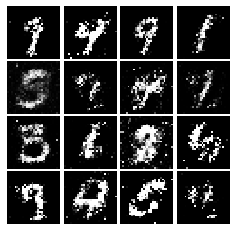

Epoch: 6, Iter: 3140, D: 1.374, G:0.8418


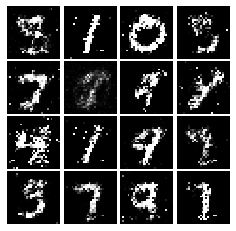

Epoch: 6, Iter: 3160, D: 1.303, G:0.7359


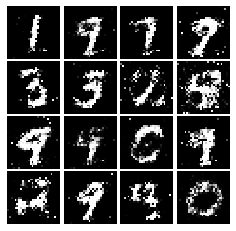

Epoch: 6, Iter: 3180, D: 1.205, G:0.9212


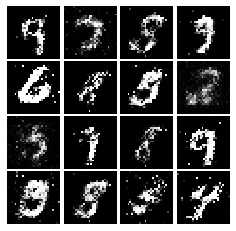

Epoch: 6, Iter: 3200, D: 1.264, G:0.8802


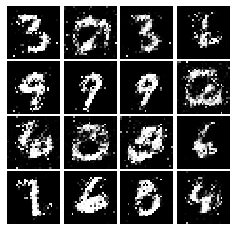

Epoch: 6, Iter: 3220, D: 1.407, G:0.847


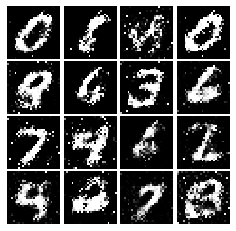

Epoch: 6, Iter: 3240, D: 1.265, G:0.8267


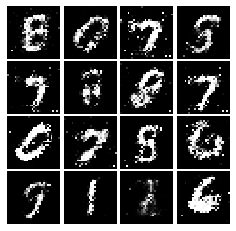

Epoch: 6, Iter: 3260, D: 1.351, G:0.7603


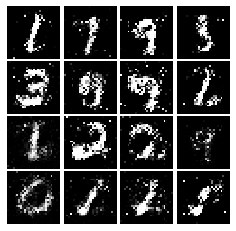

Epoch: 6, Iter: 3280, D: 1.334, G:0.8055


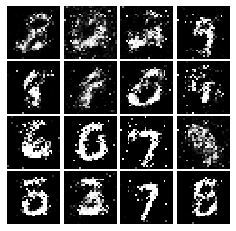

Epoch: 7, Iter: 3300, D: 1.327, G:0.7973


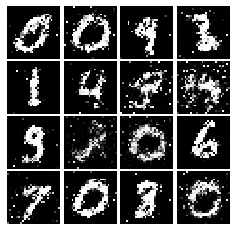

Epoch: 7, Iter: 3320, D: 1.295, G:0.7859


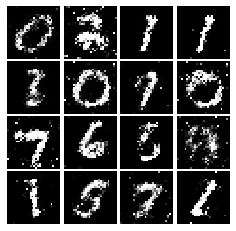

Epoch: 7, Iter: 3340, D: 1.278, G:0.8304


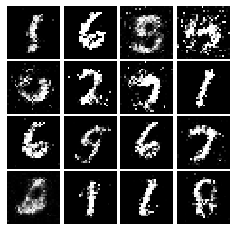

Epoch: 7, Iter: 3360, D: 1.285, G:0.8173


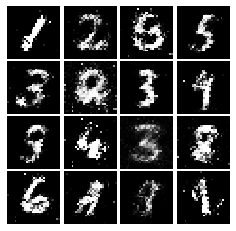

Epoch: 7, Iter: 3380, D: 1.327, G:0.8266


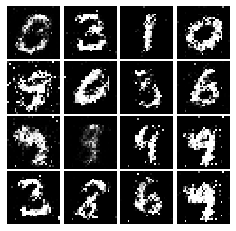

Epoch: 7, Iter: 3400, D: 1.426, G:0.8908


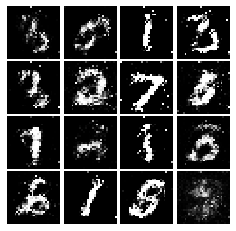

Epoch: 7, Iter: 3420, D: 1.339, G:0.8243


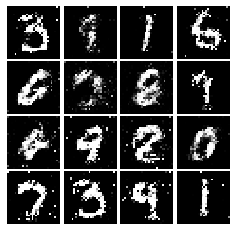

Epoch: 7, Iter: 3440, D: 1.28, G:0.8245


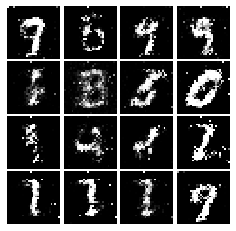

Epoch: 7, Iter: 3460, D: 1.3, G:0.7669


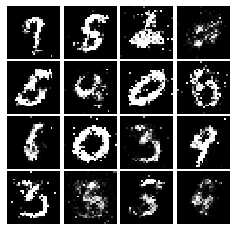

Epoch: 7, Iter: 3480, D: 1.402, G:0.7214


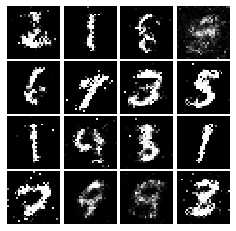

Epoch: 7, Iter: 3500, D: 1.292, G:0.8109


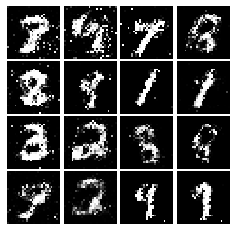

Epoch: 7, Iter: 3520, D: 1.288, G:0.7652


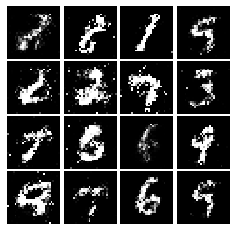

Epoch: 7, Iter: 3540, D: 1.296, G:0.7555


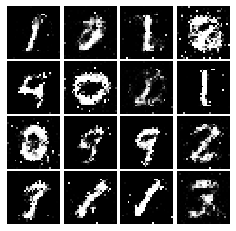

Epoch: 7, Iter: 3560, D: 1.309, G:0.7475


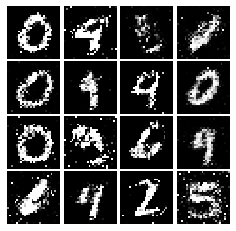

Epoch: 7, Iter: 3580, D: 1.376, G:0.8854


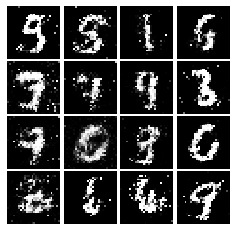

Epoch: 7, Iter: 3600, D: 1.325, G:0.7506


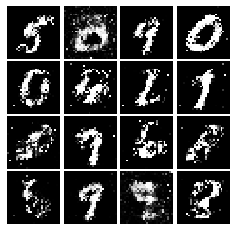

Epoch: 7, Iter: 3620, D: 1.297, G:0.8464


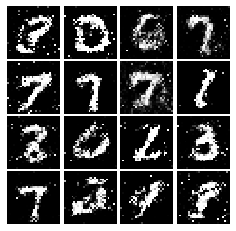

Epoch: 7, Iter: 3640, D: 1.289, G:0.8795


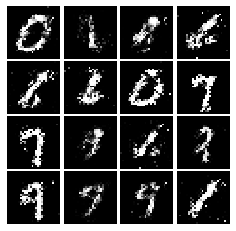

Epoch: 7, Iter: 3660, D: 1.355, G:0.7405


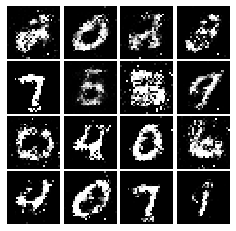

Epoch: 7, Iter: 3680, D: 1.391, G:0.9623


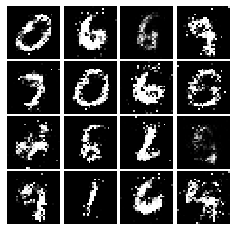

Epoch: 7, Iter: 3700, D: 1.346, G:0.8024


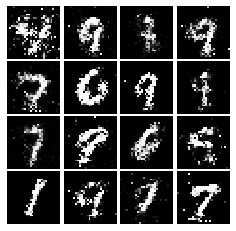

Epoch: 7, Iter: 3720, D: 1.411, G:0.9826


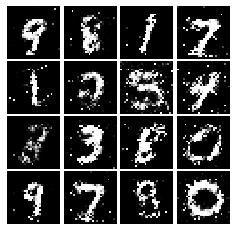

Epoch: 7, Iter: 3740, D: 1.37, G:0.8577


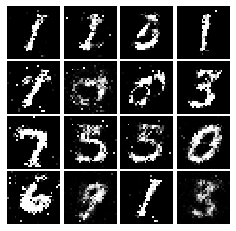

Epoch: 8, Iter: 3760, D: 1.309, G:0.7999


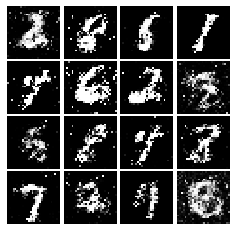

Epoch: 8, Iter: 3780, D: 1.369, G:0.7909


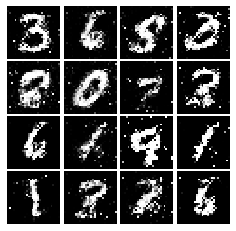

Epoch: 8, Iter: 3800, D: 1.375, G:0.8774


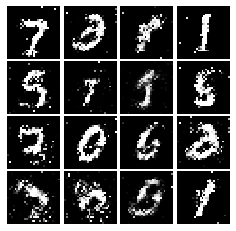

Epoch: 8, Iter: 3820, D: 1.251, G:0.8951


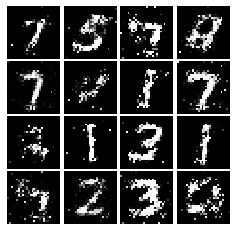

Epoch: 8, Iter: 3840, D: 1.312, G:0.8875


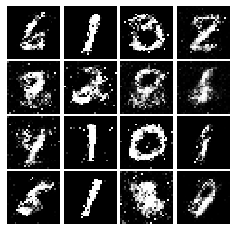

Epoch: 8, Iter: 3860, D: 1.506, G:0.7844


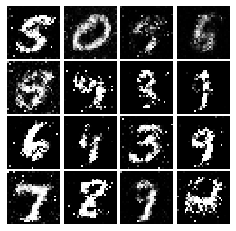

Epoch: 8, Iter: 3880, D: 1.226, G:0.9322


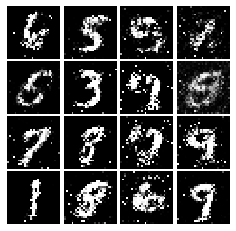

Epoch: 8, Iter: 3900, D: 1.38, G:0.7556


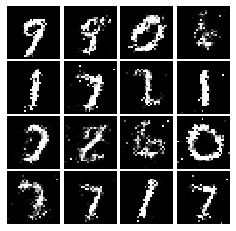

Epoch: 8, Iter: 3920, D: 1.35, G:0.8039


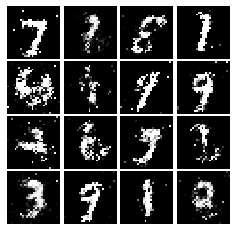

Epoch: 8, Iter: 3940, D: 1.424, G:0.9098


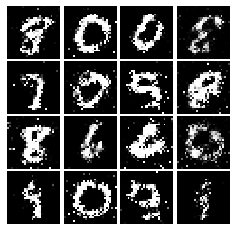

Epoch: 8, Iter: 3960, D: 1.34, G:0.7871


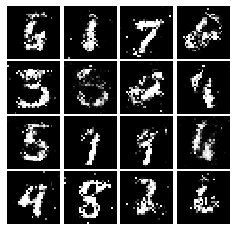

Epoch: 8, Iter: 3980, D: 1.381, G:0.8351


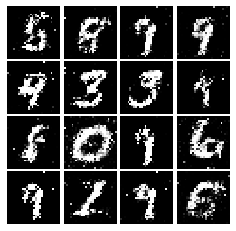

Epoch: 8, Iter: 4000, D: 1.325, G:0.8455


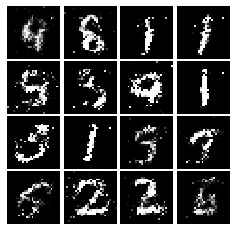

Epoch: 8, Iter: 4020, D: 1.379, G:0.7411


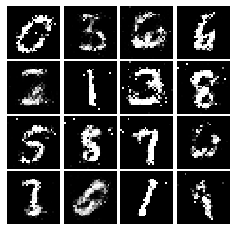

Epoch: 8, Iter: 4040, D: 1.237, G:0.944


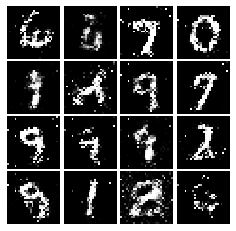

Epoch: 8, Iter: 4060, D: 1.218, G:0.847


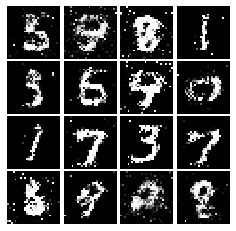

Epoch: 8, Iter: 4080, D: 1.379, G:0.8263


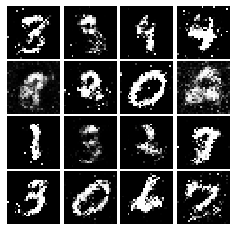

Epoch: 8, Iter: 4100, D: 1.364, G:0.9176


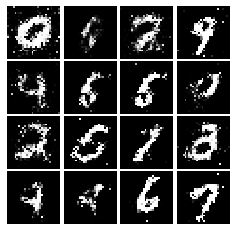

Epoch: 8, Iter: 4120, D: 1.301, G:0.8273


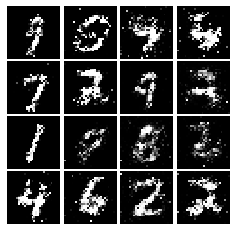

Epoch: 8, Iter: 4140, D: 1.411, G:0.7351


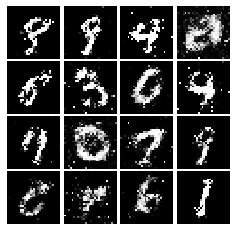

Epoch: 8, Iter: 4160, D: 1.342, G:0.8457


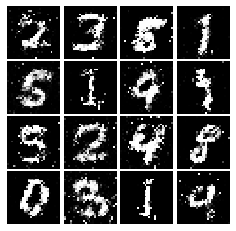

Epoch: 8, Iter: 4180, D: 1.353, G:0.847


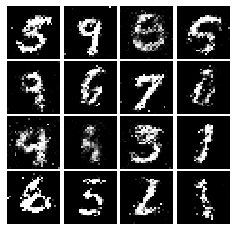

Epoch: 8, Iter: 4200, D: 1.283, G:0.8297


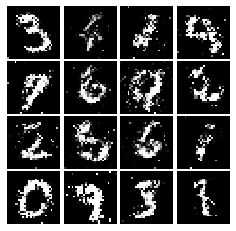

Epoch: 8, Iter: 4220, D: 1.255, G:0.7993


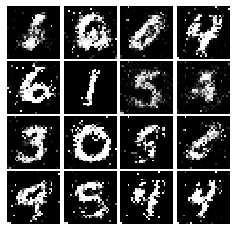

Epoch: 9, Iter: 4240, D: 1.397, G:0.7991


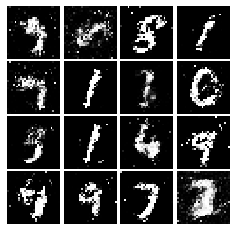

Epoch: 9, Iter: 4260, D: 1.419, G:0.835


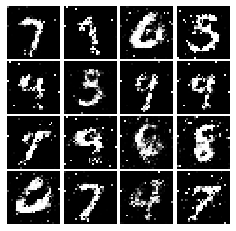

Epoch: 9, Iter: 4280, D: 1.392, G:0.807


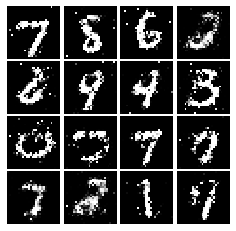

Epoch: 9, Iter: 4300, D: 1.344, G:0.7437


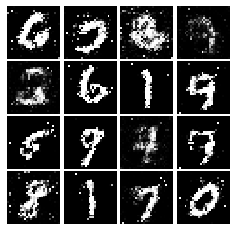

Epoch: 9, Iter: 4320, D: 1.373, G:0.8111


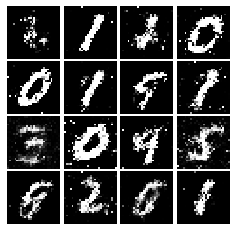

Epoch: 9, Iter: 4340, D: 1.31, G:0.7394


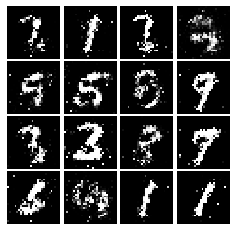

Epoch: 9, Iter: 4360, D: 1.306, G:0.8707


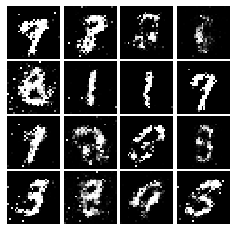

Epoch: 9, Iter: 4380, D: 1.46, G:0.829


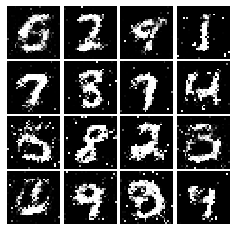

Epoch: 9, Iter: 4400, D: 1.3, G:0.8033


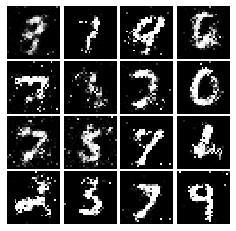

Epoch: 9, Iter: 4420, D: 1.316, G:0.7806


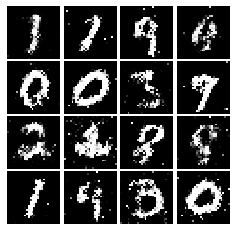

Epoch: 9, Iter: 4440, D: 1.315, G:0.7865


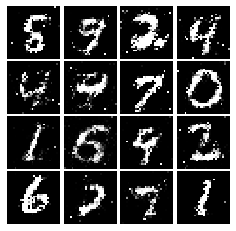

Epoch: 9, Iter: 4460, D: 1.297, G:0.7705


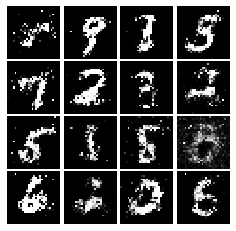

Epoch: 9, Iter: 4480, D: 1.405, G:0.8444


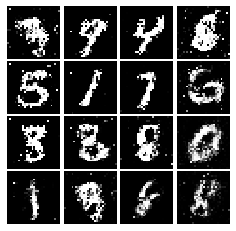

Epoch: 9, Iter: 4500, D: 1.438, G:0.7576


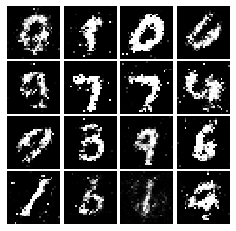

Epoch: 9, Iter: 4520, D: 1.366, G:0.773


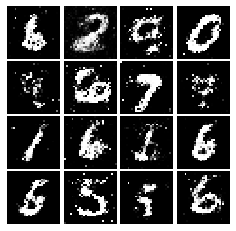

Epoch: 9, Iter: 4540, D: 1.376, G:0.8862


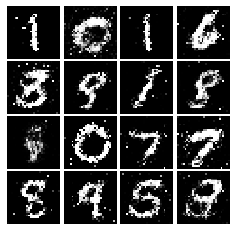

Epoch: 9, Iter: 4560, D: 1.321, G:0.7313


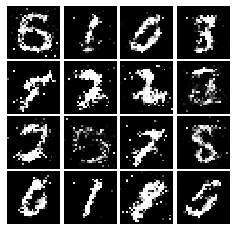

Epoch: 9, Iter: 4580, D: 1.337, G:0.8004


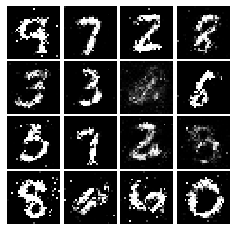

Epoch: 9, Iter: 4600, D: 1.398, G:0.7613


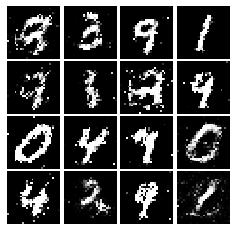

Epoch: 9, Iter: 4620, D: 1.309, G:0.7882


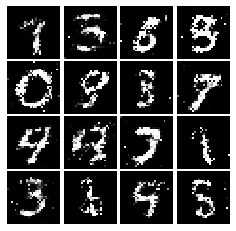

Epoch: 9, Iter: 4640, D: 1.343, G:0.7894


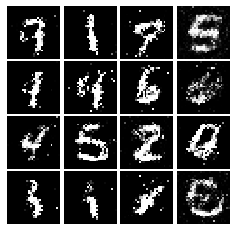

Epoch: 9, Iter: 4660, D: 1.346, G:0.7199


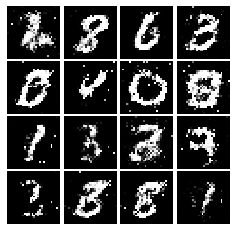

Epoch: 9, Iter: 4680, D: 1.476, G:0.7451


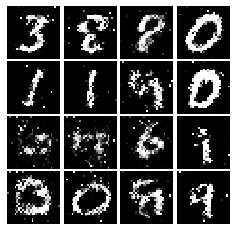

Final images


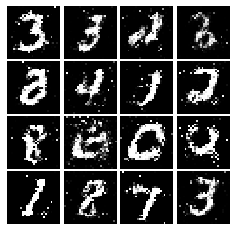

In [18]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss)

# Least Squares GAN
We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alternative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$


**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`score_real` and `score_fake`).

In [19]:
def ls_discriminator_loss(scores_real, scores_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.
    
    Inputs:
    - scores_real: Tensor of shape (N, 1) giving scores for the real data.
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    
    loss = 0.5 * tf.reduce_mean(tf.square(scores_real - 1)) + 0.5 * tf.reduce_mean(tf.square(scores_fake))

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def ls_generator_loss(scores_fake):
    """
    Computes the Least-Squares GAN loss for the generator.
    
    Inputs:
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss = 0.5 * tf.reduce_mean(tf.square(scores_fake - 1))

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your LSGAN loss. You should see errors less than 1e-8.

In [20]:
def test_lsgan_loss(score_real, score_fake, d_loss_true, g_loss_true):
    
    d_loss = ls_discriminator_loss(tf.constant(score_real), tf.constant(score_fake))
    g_loss = ls_generator_loss(tf.constant(score_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_lsgan_loss(answers['logits_real'], answers['logits_fake'],
                answers['d_loss_lsgan_true'], answers['g_loss_lsgan_true'])

Maximum error in d_loss: 0
Maximum error in g_loss: 0


Create new training steps so we instead minimize the LSGAN loss:

Epoch: 0, Iter: 0, D: 2.112, G:0.4294


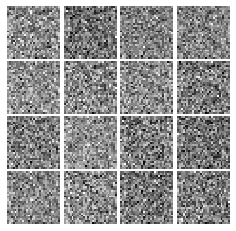

Epoch: 0, Iter: 20, D: 0.03, G:1.075


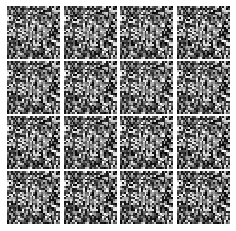

Epoch: 0, Iter: 40, D: 0.03754, G:0.7662


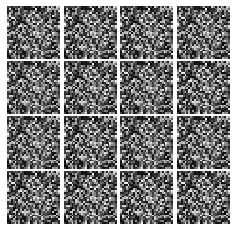

Epoch: 0, Iter: 60, D: 0.03036, G:0.583


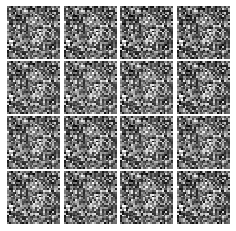

Epoch: 0, Iter: 80, D: 0.024, G:0.693


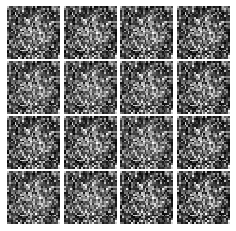

Epoch: 0, Iter: 100, D: 0.07765, G:0.7778


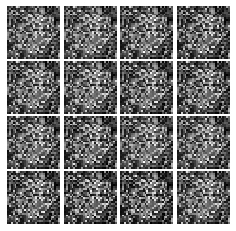

Epoch: 0, Iter: 120, D: 0.9517, G:0.0439


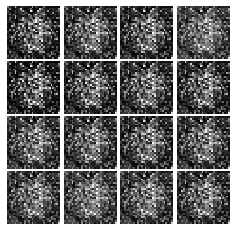

Epoch: 0, Iter: 140, D: 0.5932, G:0.2149


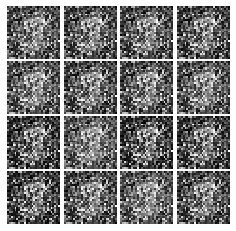

Epoch: 0, Iter: 160, D: 0.1197, G:0.4345


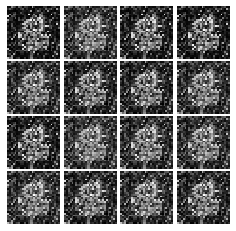

Epoch: 0, Iter: 180, D: 0.2989, G:0.154


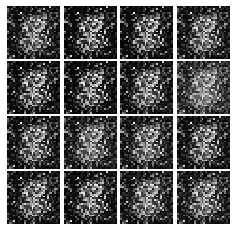

Epoch: 0, Iter: 200, D: 0.06403, G:0.4947


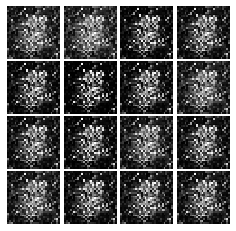

Epoch: 0, Iter: 220, D: 0.266, G:1.258


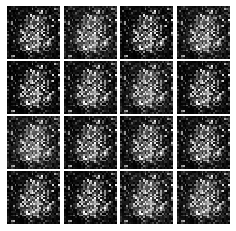

Epoch: 0, Iter: 240, D: 0.08796, G:0.4799


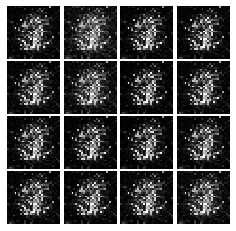

Epoch: 0, Iter: 260, D: 0.1452, G:0.351


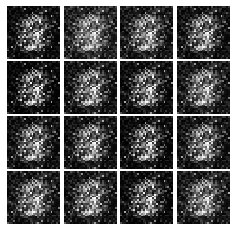

Epoch: 0, Iter: 280, D: 0.2012, G:0.5225


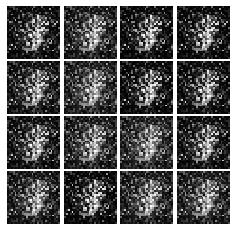

Epoch: 0, Iter: 300, D: 0.1454, G:0.3394


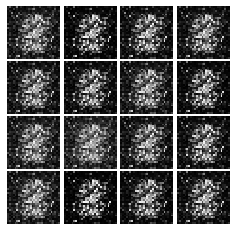

Epoch: 0, Iter: 320, D: 0.08197, G:0.5066


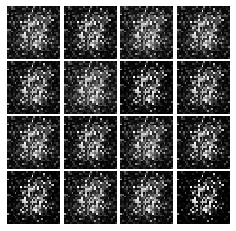

Epoch: 0, Iter: 340, D: 0.1116, G:0.5493


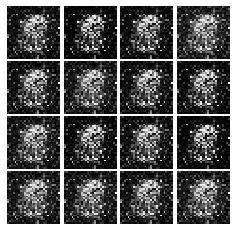

Epoch: 0, Iter: 360, D: 0.1221, G:0.5107


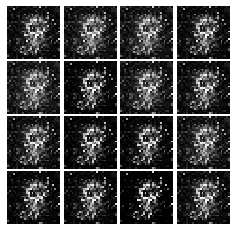

Epoch: 0, Iter: 380, D: 0.07224, G:0.7379


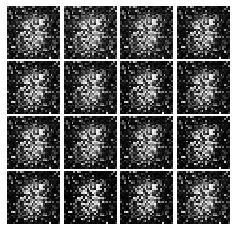

Epoch: 0, Iter: 400, D: 0.1159, G:0.4949


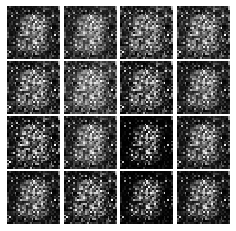

Epoch: 0, Iter: 420, D: 0.1531, G:0.4289


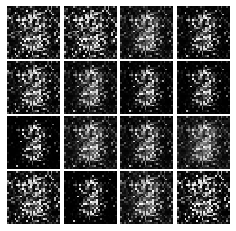

Epoch: 0, Iter: 440, D: 0.3197, G:0.7964


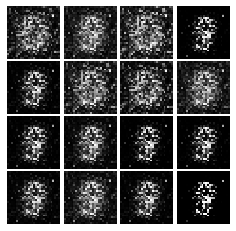

Epoch: 0, Iter: 460, D: 0.2366, G:0.7473


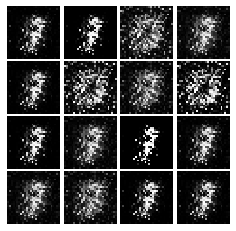

Epoch: 1, Iter: 480, D: 0.222, G:0.3987


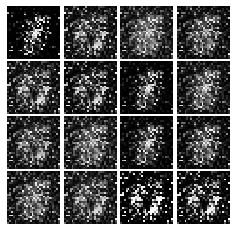

Epoch: 1, Iter: 500, D: 0.1321, G:0.7451


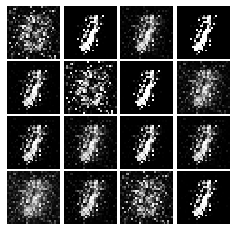

Epoch: 1, Iter: 520, D: 0.0727, G:0.5018


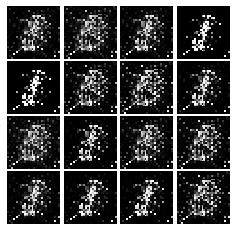

Epoch: 1, Iter: 540, D: 0.1109, G:0.3196


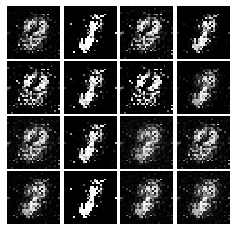

Epoch: 1, Iter: 560, D: 0.1065, G:0.3569


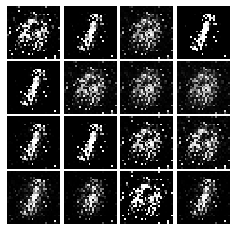

Epoch: 1, Iter: 580, D: 0.07229, G:0.4474


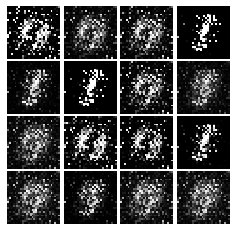

Epoch: 1, Iter: 600, D: 0.1607, G:0.273


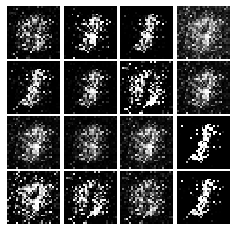

Epoch: 1, Iter: 620, D: 0.1155, G:0.3636


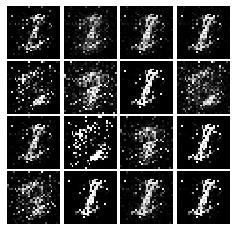

Epoch: 1, Iter: 640, D: 0.1863, G:0.3738


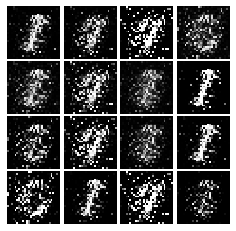

Epoch: 1, Iter: 660, D: 0.1631, G:0.1342


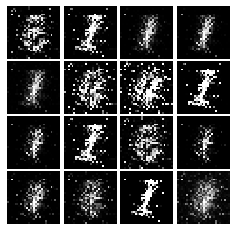

Epoch: 1, Iter: 680, D: 0.1788, G:0.5172


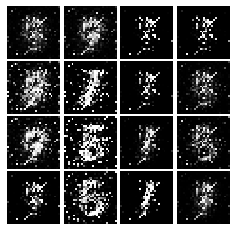

Epoch: 1, Iter: 700, D: 0.1545, G:0.5294


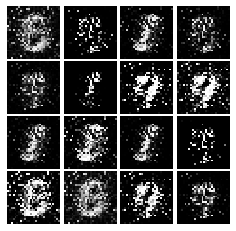

Epoch: 1, Iter: 720, D: 0.1262, G:0.4686


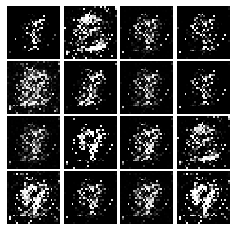

Epoch: 1, Iter: 740, D: 0.147, G:0.134


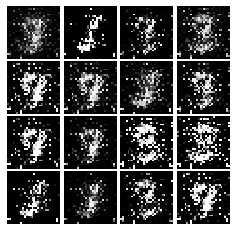

Epoch: 1, Iter: 760, D: 0.2081, G:0.03936


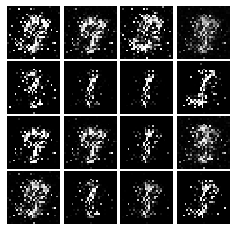

Epoch: 1, Iter: 780, D: 0.1622, G:0.5691


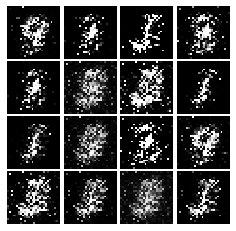

Epoch: 1, Iter: 800, D: 0.09269, G:0.3906


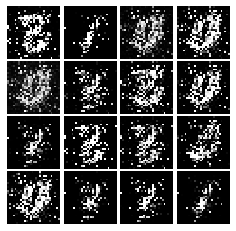

Epoch: 1, Iter: 820, D: 0.1123, G:0.3191


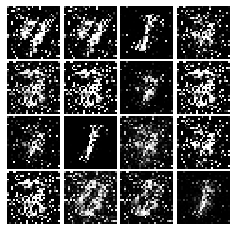

Epoch: 1, Iter: 840, D: 0.09664, G:0.691


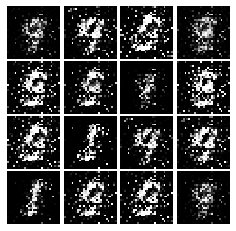

Epoch: 1, Iter: 860, D: 0.1221, G:0.4004


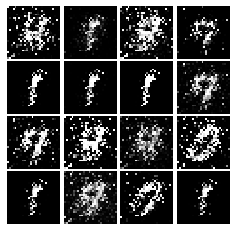

Epoch: 1, Iter: 880, D: 0.1135, G:0.3821


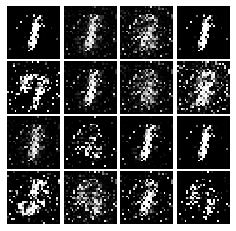

Epoch: 1, Iter: 900, D: 0.145, G:0.4193


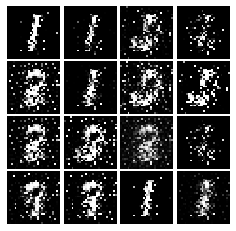

Epoch: 1, Iter: 920, D: 0.1449, G:0.3536


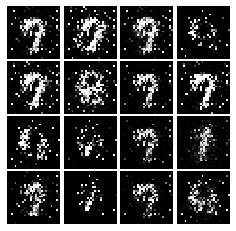

Epoch: 2, Iter: 940, D: 0.1466, G:0.298


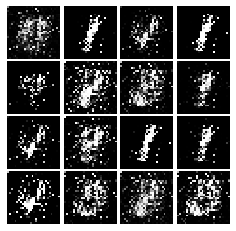

Epoch: 2, Iter: 960, D: 0.1266, G:0.3917


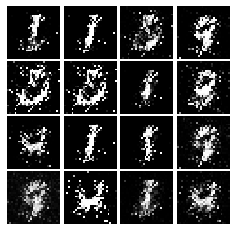

Epoch: 2, Iter: 980, D: 0.1046, G:0.4132


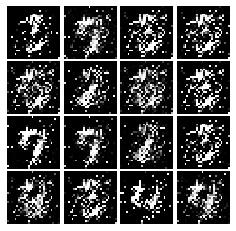

Epoch: 2, Iter: 1000, D: 0.1133, G:0.8992


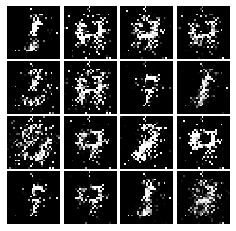

Epoch: 2, Iter: 1020, D: 0.1312, G:0.3873


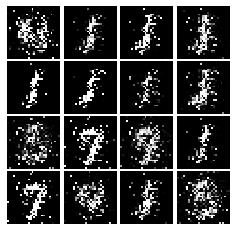

Epoch: 2, Iter: 1040, D: 0.1148, G:0.5639


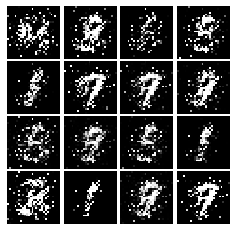

Epoch: 2, Iter: 1060, D: 0.2683, G:0.4428


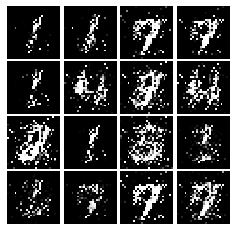

Epoch: 2, Iter: 1080, D: 0.1367, G:0.4376


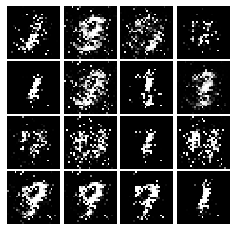

Epoch: 2, Iter: 1100, D: 0.134, G:0.2213


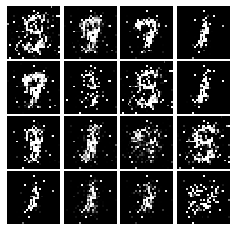

Epoch: 2, Iter: 1120, D: 0.1201, G:0.4511


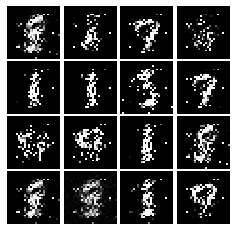

Epoch: 2, Iter: 1140, D: 0.1632, G:0.6672


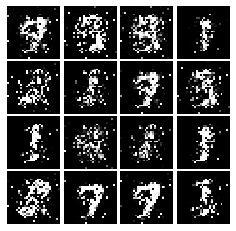

Epoch: 2, Iter: 1160, D: 0.1519, G:0.1818


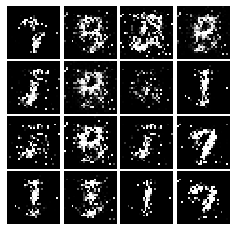

Epoch: 2, Iter: 1180, D: 0.1143, G:0.3114


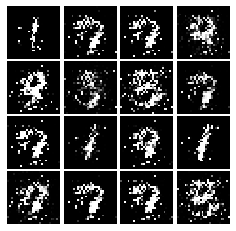

Epoch: 2, Iter: 1200, D: 0.1118, G:0.3292


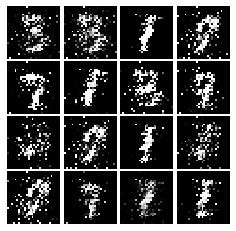

Epoch: 2, Iter: 1220, D: 0.1176, G:0.2577


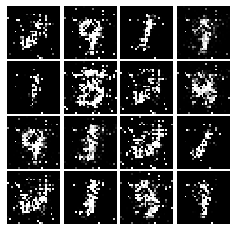

Epoch: 2, Iter: 1240, D: 0.1032, G:1.144


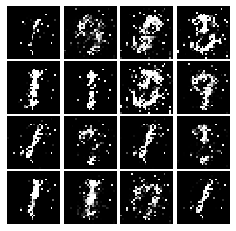

Epoch: 2, Iter: 1260, D: 0.1654, G:0.2762


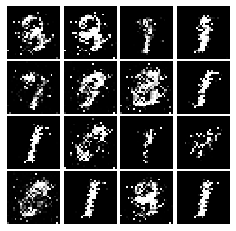

Epoch: 2, Iter: 1280, D: 0.1458, G:0.2342


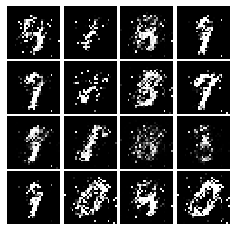

Epoch: 2, Iter: 1300, D: 0.1402, G:0.2763


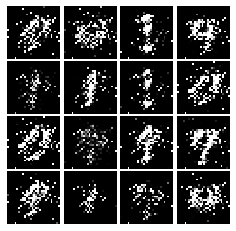

Epoch: 2, Iter: 1320, D: 0.1561, G:0.2282


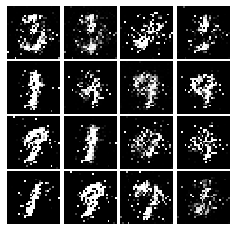

Epoch: 2, Iter: 1340, D: 0.1135, G:0.3887


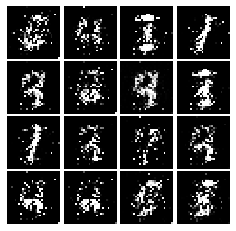

Epoch: 2, Iter: 1360, D: 0.3542, G:0.3581


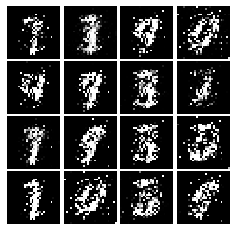

Epoch: 2, Iter: 1380, D: 0.1257, G:0.3113


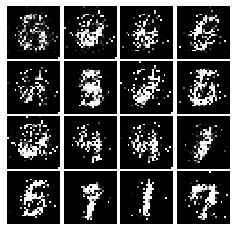

Epoch: 2, Iter: 1400, D: 0.136, G:0.2996


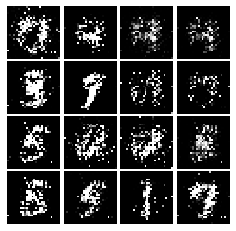

Epoch: 3, Iter: 1420, D: 0.174, G:0.3892


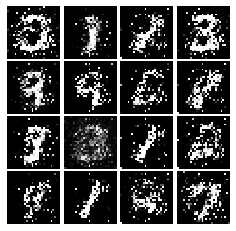

Epoch: 3, Iter: 1440, D: 0.1719, G:0.2953


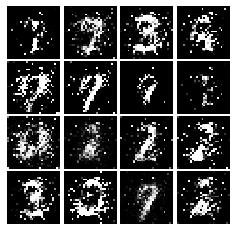

Epoch: 3, Iter: 1460, D: 0.1931, G:0.4139


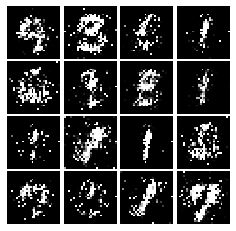

Epoch: 3, Iter: 1480, D: 0.1516, G:0.3683


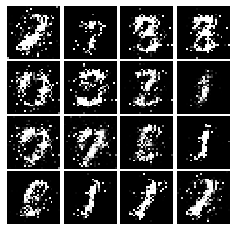

Epoch: 3, Iter: 1500, D: 0.1808, G:0.2183


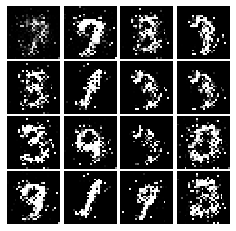

Epoch: 3, Iter: 1520, D: 0.1628, G:0.2759


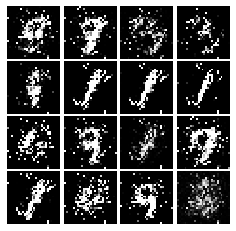

Epoch: 3, Iter: 1540, D: 0.1591, G:0.3114


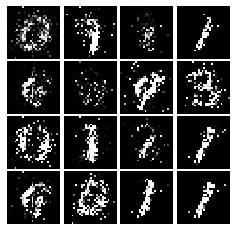

Epoch: 3, Iter: 1560, D: 0.136, G:0.3274


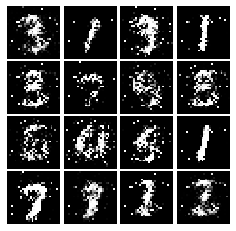

Epoch: 3, Iter: 1580, D: 0.1607, G:0.3173


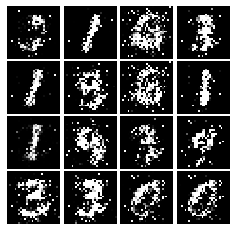

Epoch: 3, Iter: 1600, D: 0.1772, G:0.2783


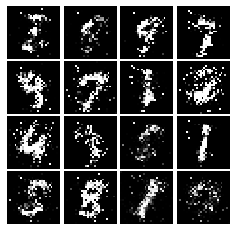

Epoch: 3, Iter: 1620, D: 0.1487, G:0.2689


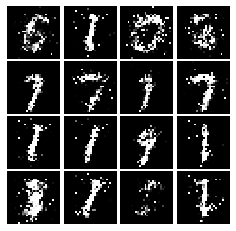

Epoch: 3, Iter: 1640, D: 0.1743, G:0.2468


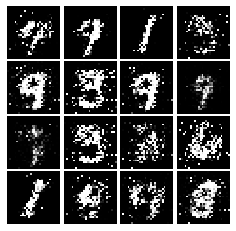

Epoch: 3, Iter: 1660, D: 0.1407, G:0.3598


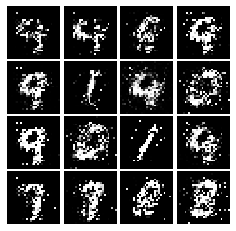

Epoch: 3, Iter: 1680, D: 0.169, G:0.2448


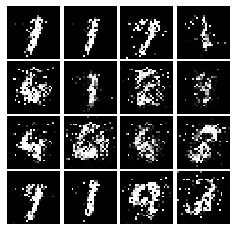

Epoch: 3, Iter: 1700, D: 0.2087, G:0.1071


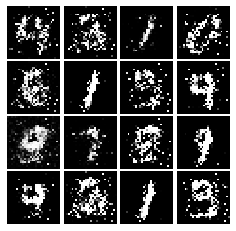

Epoch: 3, Iter: 1720, D: 0.1852, G:0.2139


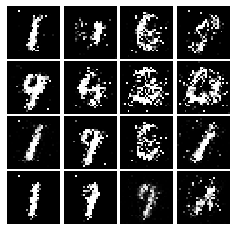

Epoch: 3, Iter: 1740, D: 0.1863, G:0.244


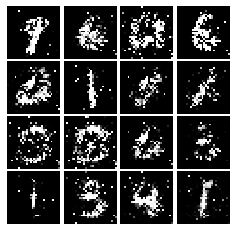

Epoch: 3, Iter: 1760, D: 0.1935, G:2.2


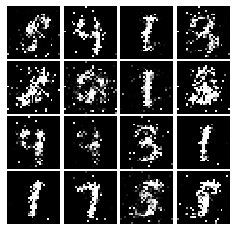

Epoch: 3, Iter: 1780, D: 0.2462, G:0.1642


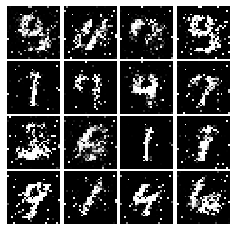

Epoch: 3, Iter: 1800, D: 0.235, G:0.2156


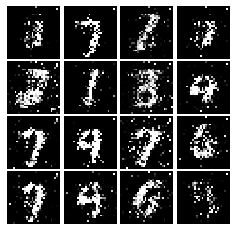

Epoch: 3, Iter: 1820, D: 0.2396, G:0.152


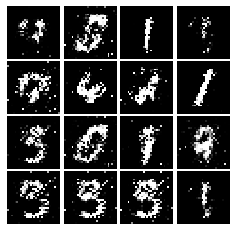

Epoch: 3, Iter: 1840, D: 0.2176, G:0.1739


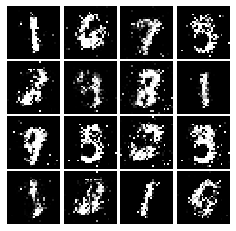

Epoch: 3, Iter: 1860, D: 0.2087, G:0.1602


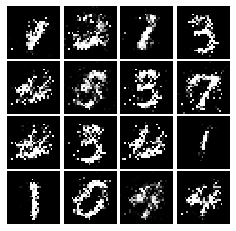

Epoch: 4, Iter: 1880, D: 0.187, G:0.2222


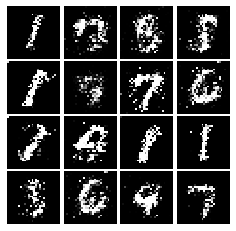

Epoch: 4, Iter: 1900, D: 0.2233, G:0.1598


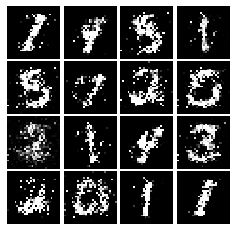

Epoch: 4, Iter: 1920, D: 0.2142, G:0.2122


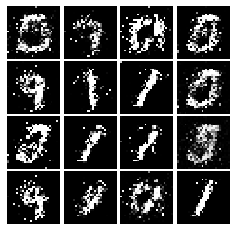

Epoch: 4, Iter: 1940, D: 0.1864, G:0.2192


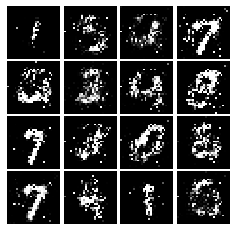

Epoch: 4, Iter: 1960, D: 0.2168, G:0.2181


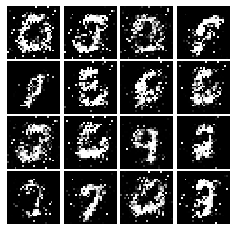

Epoch: 4, Iter: 1980, D: 0.2021, G:0.171


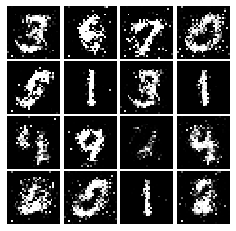

Epoch: 4, Iter: 2000, D: 0.2233, G:0.1817


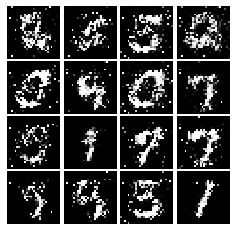

Epoch: 4, Iter: 2020, D: 0.2118, G:0.2428


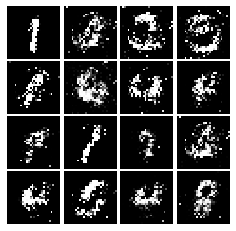

Epoch: 4, Iter: 2040, D: 0.2087, G:0.1817


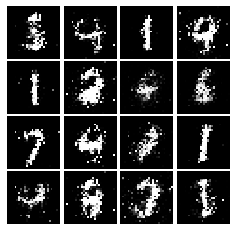

Epoch: 4, Iter: 2060, D: 0.1979, G:0.1689


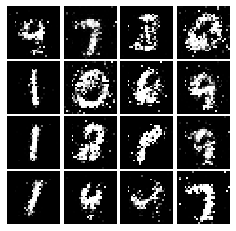

Epoch: 4, Iter: 2080, D: 0.2342, G:0.1858


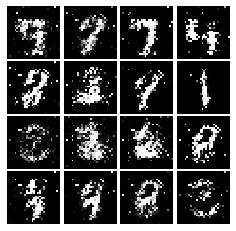

Epoch: 4, Iter: 2100, D: 0.2401, G:0.1917


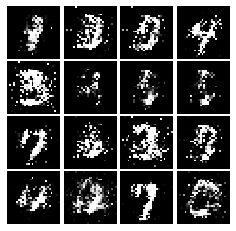

Epoch: 4, Iter: 2120, D: 0.2041, G:0.3761


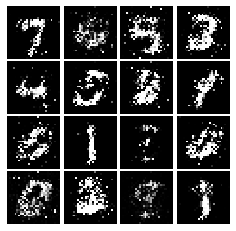

Epoch: 4, Iter: 2140, D: 0.23, G:0.1752


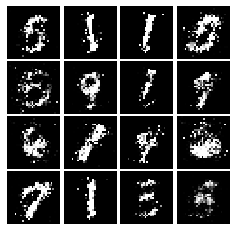

Epoch: 4, Iter: 2160, D: 0.2267, G:0.1902


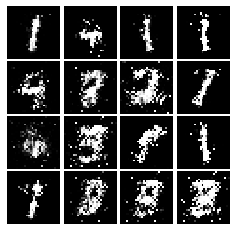

Epoch: 4, Iter: 2180, D: 0.2165, G:0.2733


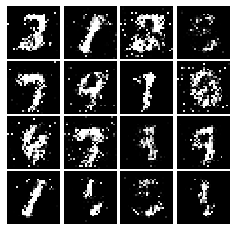

Epoch: 4, Iter: 2200, D: 0.2022, G:0.2024


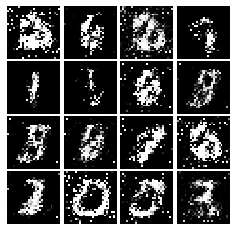

Epoch: 4, Iter: 2220, D: 0.2032, G:0.1881


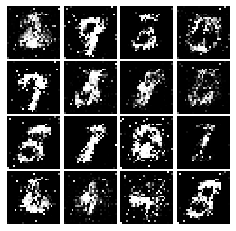

Epoch: 4, Iter: 2240, D: 0.2659, G:0.2085


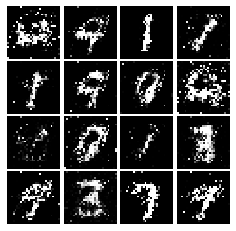

Epoch: 4, Iter: 2260, D: 0.2158, G:0.1864


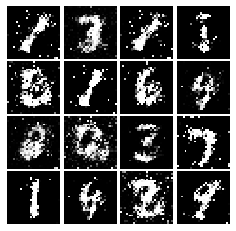

Epoch: 4, Iter: 2280, D: 0.2146, G:0.1691


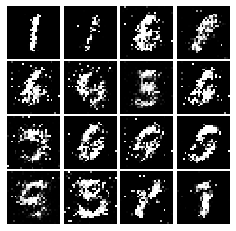

Epoch: 4, Iter: 2300, D: 0.2375, G:0.1632


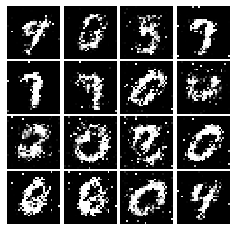

Epoch: 4, Iter: 2320, D: 0.2091, G:0.1975


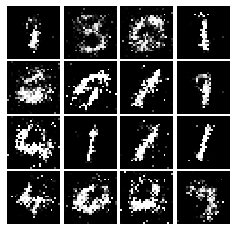

Epoch: 4, Iter: 2340, D: 0.2016, G:0.1863


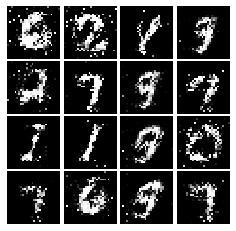

Epoch: 5, Iter: 2360, D: 0.2091, G:0.1854


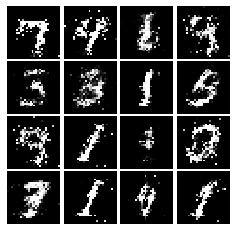

Epoch: 5, Iter: 2380, D: 0.1964, G:0.1892


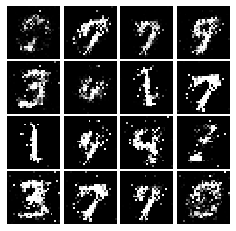

Epoch: 5, Iter: 2400, D: 0.2235, G:0.2191


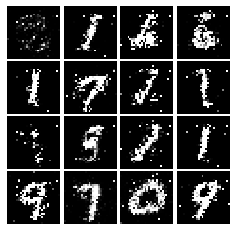

Epoch: 5, Iter: 2420, D: 0.188, G:0.265


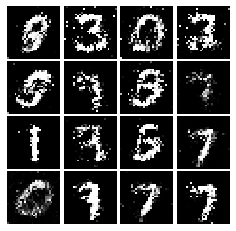

Epoch: 5, Iter: 2440, D: 0.2228, G:0.1763


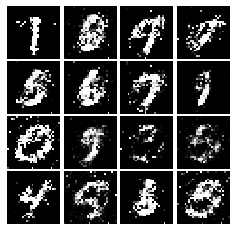

Epoch: 5, Iter: 2460, D: 0.2086, G:0.2136


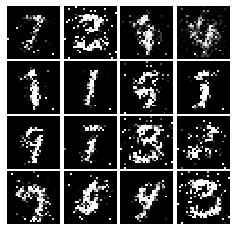

Epoch: 5, Iter: 2480, D: 0.2254, G:0.1756


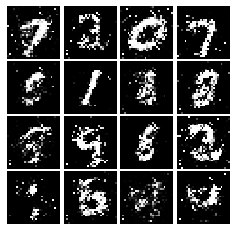

Epoch: 5, Iter: 2500, D: 0.1939, G:0.2107


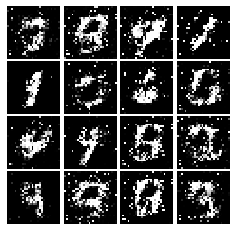

Epoch: 5, Iter: 2520, D: 0.247, G:0.1771


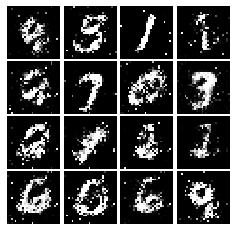

Epoch: 5, Iter: 2540, D: 0.2262, G:0.2105


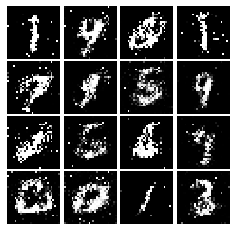

Epoch: 5, Iter: 2560, D: 0.225, G:0.1987


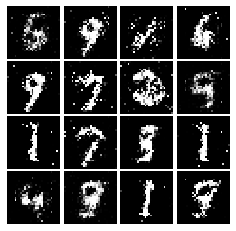

Epoch: 5, Iter: 2580, D: 0.2122, G:0.2246


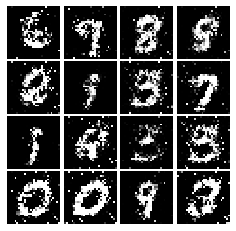

Epoch: 5, Iter: 2600, D: 0.2569, G:0.1364


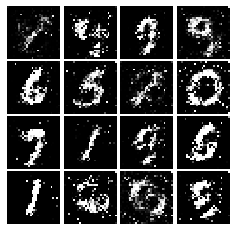

Epoch: 5, Iter: 2620, D: 0.2083, G:0.1664


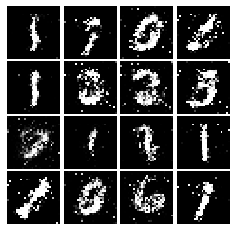

Epoch: 5, Iter: 2640, D: 0.2184, G:0.1844


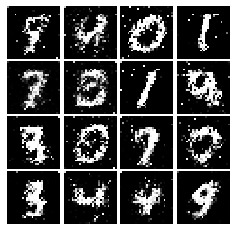

Epoch: 5, Iter: 2660, D: 0.2151, G:0.2046


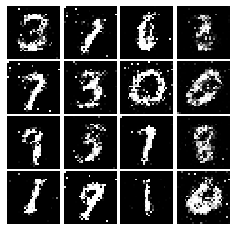

Epoch: 5, Iter: 2680, D: 0.2368, G:0.1884


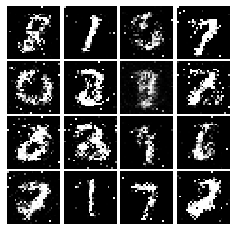

Epoch: 5, Iter: 2700, D: 0.2097, G:0.1604


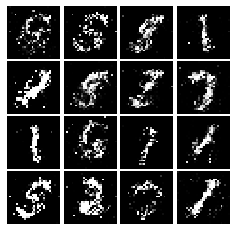

Epoch: 5, Iter: 2720, D: 0.2252, G:0.1646


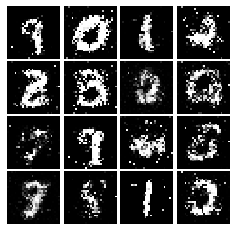

Epoch: 5, Iter: 2740, D: 0.1822, G:0.1967


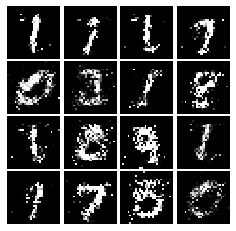

Epoch: 5, Iter: 2760, D: 0.2106, G:0.2002


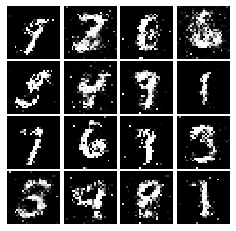

Epoch: 5, Iter: 2780, D: 0.2066, G:0.1964


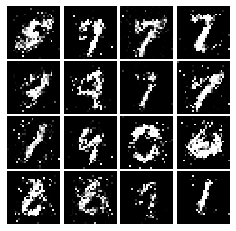

Epoch: 5, Iter: 2800, D: 0.1963, G:0.2427


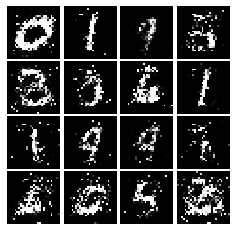

Epoch: 6, Iter: 2820, D: 0.2156, G:0.1981


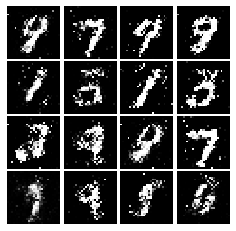

Epoch: 6, Iter: 2840, D: 0.2184, G:0.2017


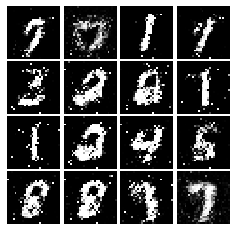

Epoch: 6, Iter: 2860, D: 0.2146, G:0.1888


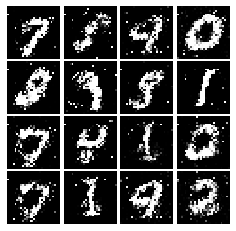

Epoch: 6, Iter: 2880, D: 0.2193, G:0.1898


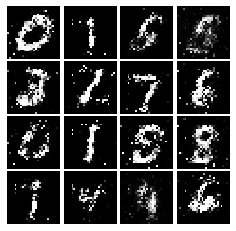

Epoch: 6, Iter: 2900, D: 0.2192, G:0.1874


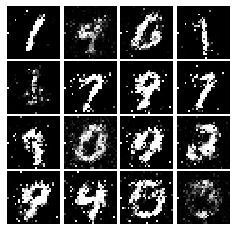

Epoch: 6, Iter: 2920, D: 0.2355, G:0.159


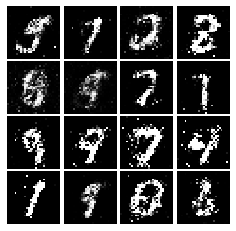

Epoch: 6, Iter: 2940, D: 0.2554, G:0.1804


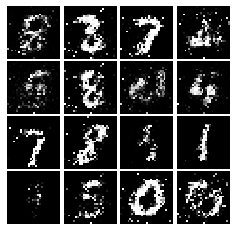

Epoch: 6, Iter: 2960, D: 0.2341, G:0.1937


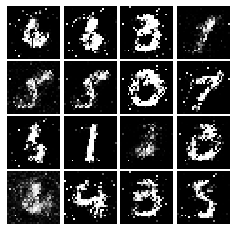

Epoch: 6, Iter: 2980, D: 0.2279, G:0.1755


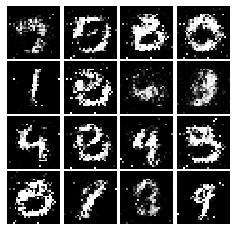

Epoch: 6, Iter: 3000, D: 0.2398, G:0.1422


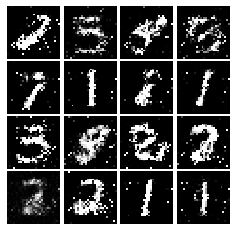

Epoch: 6, Iter: 3020, D: 0.2137, G:0.1733


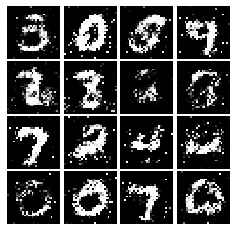

Epoch: 6, Iter: 3040, D: 0.2137, G:0.1601


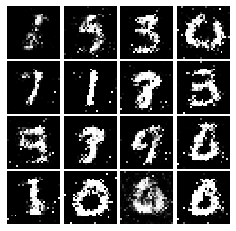

Epoch: 6, Iter: 3060, D: 0.2243, G:0.1737


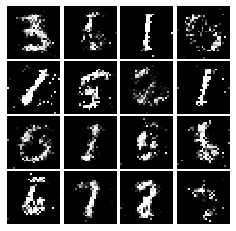

Epoch: 6, Iter: 3080, D: 0.2352, G:0.1822


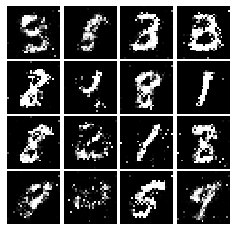

Epoch: 6, Iter: 3100, D: 0.2062, G:0.1912


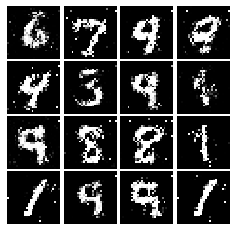

Epoch: 6, Iter: 3120, D: 0.2172, G:0.1613


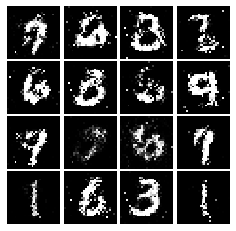

Epoch: 6, Iter: 3140, D: 0.2415, G:0.1538


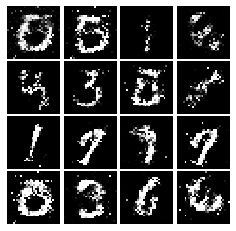

Epoch: 6, Iter: 3160, D: 0.2356, G:0.1626


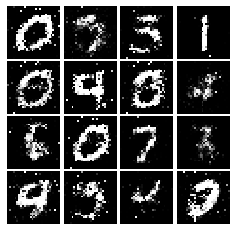

Epoch: 6, Iter: 3180, D: 0.2072, G:0.1723


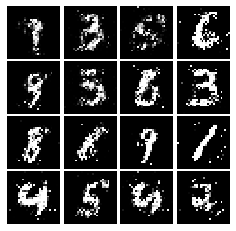

Epoch: 6, Iter: 3200, D: 0.2225, G:0.2026


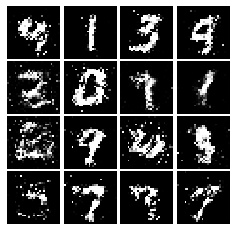

Epoch: 6, Iter: 3220, D: 0.2416, G:0.1693


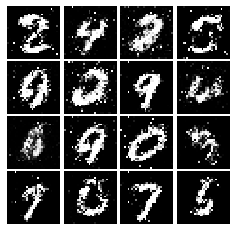

Epoch: 6, Iter: 3240, D: 0.2415, G:0.1652


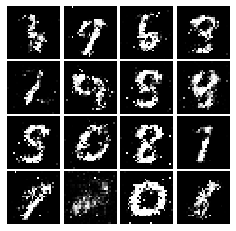

Epoch: 6, Iter: 3260, D: 0.2157, G:0.1697


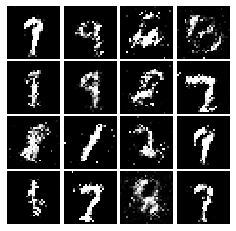

Epoch: 6, Iter: 3280, D: 0.2066, G:0.162


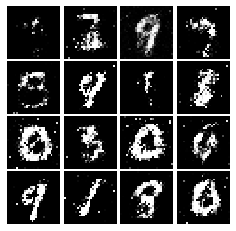

Epoch: 7, Iter: 3300, D: 0.2214, G:0.1568


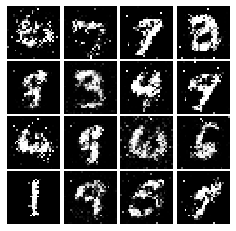

Epoch: 7, Iter: 3320, D: 0.2077, G:0.1948


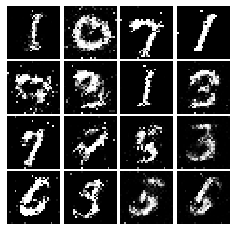

Epoch: 7, Iter: 3340, D: 0.2216, G:0.2042


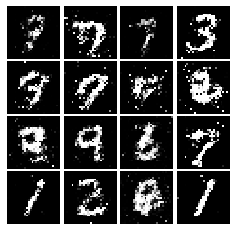

Epoch: 7, Iter: 3360, D: 0.244, G:0.1709


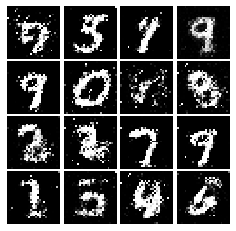

Epoch: 7, Iter: 3380, D: 0.2154, G:0.1874


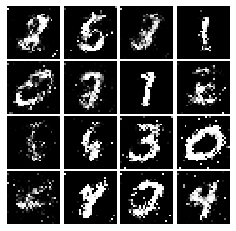

Epoch: 7, Iter: 3400, D: 0.2585, G:0.158


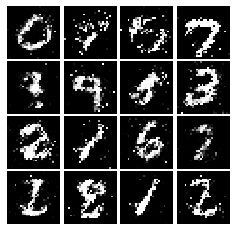

Epoch: 7, Iter: 3420, D: 0.2302, G:0.1815


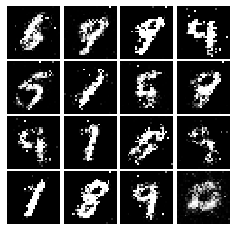

Epoch: 7, Iter: 3440, D: 0.2329, G:0.2168


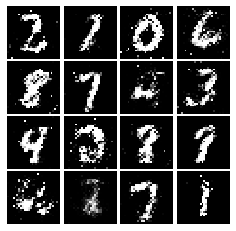

Epoch: 7, Iter: 3460, D: 0.2285, G:0.1649


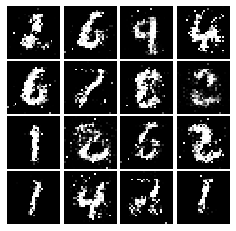

Epoch: 7, Iter: 3480, D: 0.2174, G:0.1741


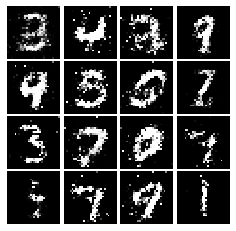

Epoch: 7, Iter: 3500, D: 0.2388, G:0.1487


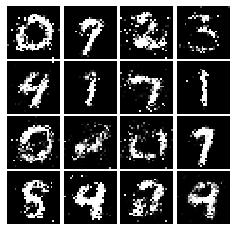

Epoch: 7, Iter: 3520, D: 0.2244, G:0.1659


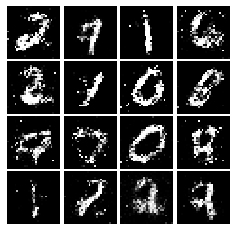

Epoch: 7, Iter: 3540, D: 0.205, G:0.1623


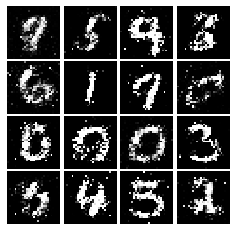

Epoch: 7, Iter: 3560, D: 0.2177, G:0.1894


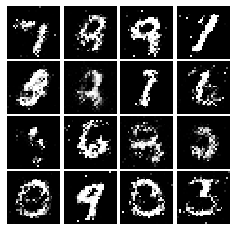

Epoch: 7, Iter: 3580, D: 0.2367, G:0.1989


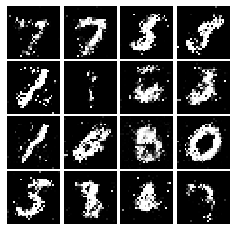

Epoch: 7, Iter: 3600, D: 0.2319, G:0.1466


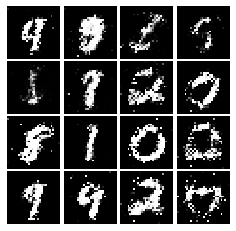

Epoch: 7, Iter: 3620, D: 0.2327, G:0.162


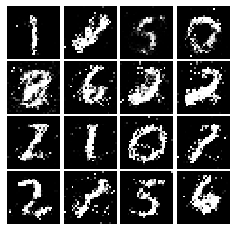

Epoch: 7, Iter: 3640, D: 0.235, G:0.1737


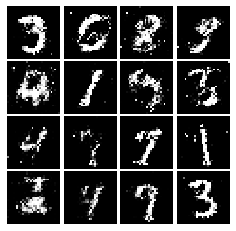

Epoch: 7, Iter: 3660, D: 0.2361, G:0.1761


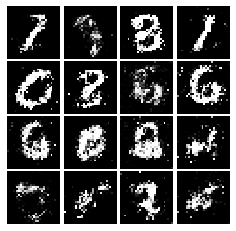

Epoch: 7, Iter: 3680, D: 0.2168, G:0.1587


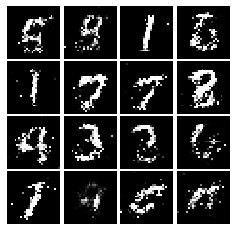

Epoch: 7, Iter: 3700, D: 0.2286, G:0.1578


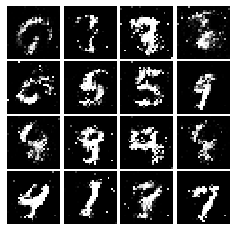

Epoch: 7, Iter: 3720, D: 0.2256, G:0.1613


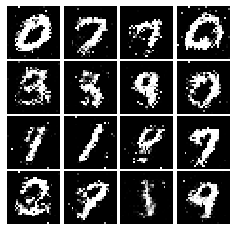

Epoch: 7, Iter: 3740, D: 0.2385, G:0.16


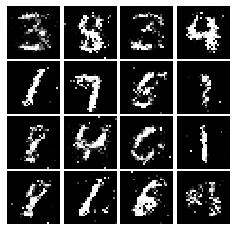

Epoch: 8, Iter: 3760, D: 0.2141, G:0.1813


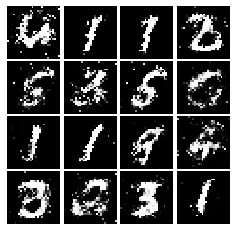

Epoch: 8, Iter: 3780, D: 0.225, G:0.1829


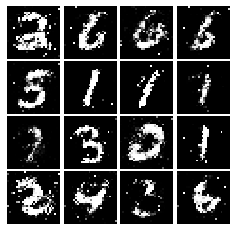

Epoch: 8, Iter: 3800, D: 0.2227, G:0.1738


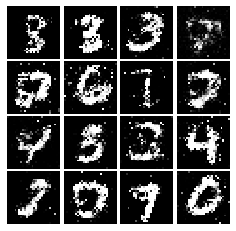

Epoch: 8, Iter: 3820, D: 0.239, G:0.1675


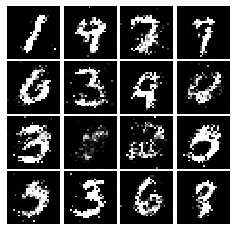

Epoch: 8, Iter: 3840, D: 0.2309, G:0.1564


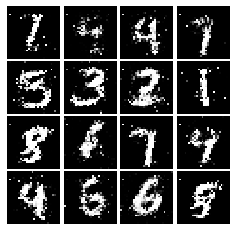

Epoch: 8, Iter: 3860, D: 0.2223, G:0.2133


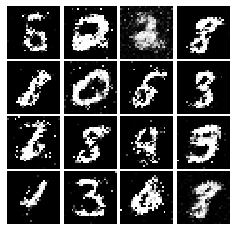

Epoch: 8, Iter: 3880, D: 0.2231, G:0.156


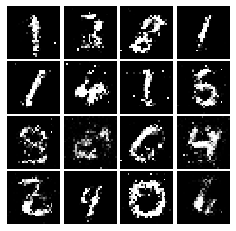

Epoch: 8, Iter: 3900, D: 0.2561, G:0.1663


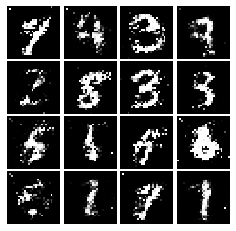

Epoch: 8, Iter: 3920, D: 0.2172, G:0.2089


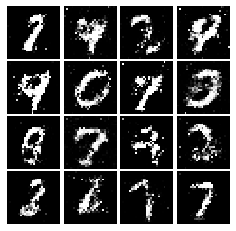

Epoch: 8, Iter: 3940, D: 0.2333, G:0.1569


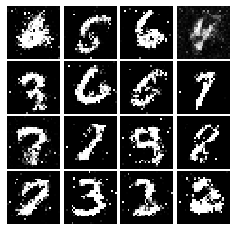

Epoch: 8, Iter: 3960, D: 0.2546, G:0.152


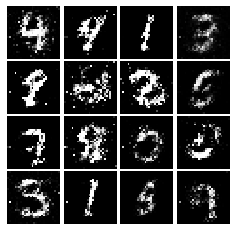

Epoch: 8, Iter: 3980, D: 0.2387, G:0.1574


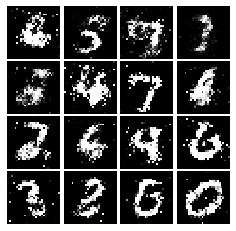

Epoch: 8, Iter: 4000, D: 0.2354, G:0.1529


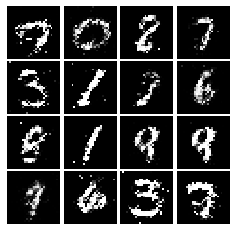

Epoch: 8, Iter: 4020, D: 0.2135, G:0.1483


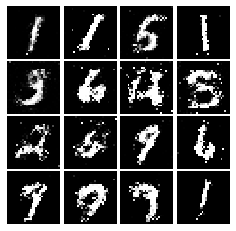

Epoch: 8, Iter: 4040, D: 0.2184, G:0.1538


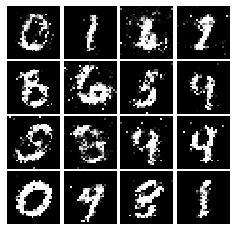

Epoch: 8, Iter: 4060, D: 0.2289, G:0.1595


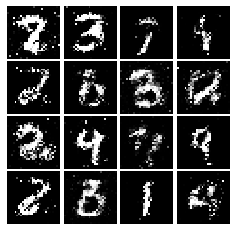

Epoch: 8, Iter: 4080, D: 0.2457, G:0.1632


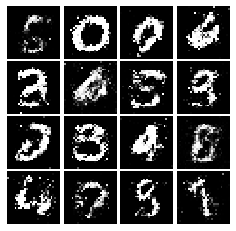

Epoch: 8, Iter: 4100, D: 0.2376, G:0.1604


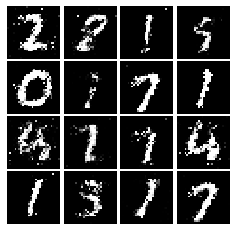

Epoch: 8, Iter: 4120, D: 0.2364, G:0.1733


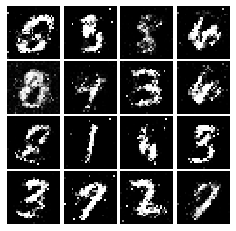

Epoch: 8, Iter: 4140, D: 0.2078, G:0.2029


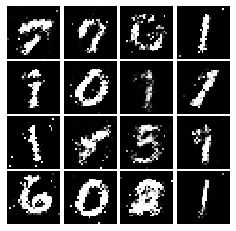

Epoch: 8, Iter: 4160, D: 0.225, G:0.1765


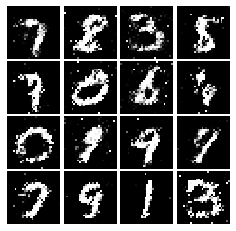

Epoch: 8, Iter: 4180, D: 0.2518, G:0.1661


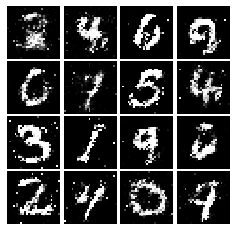

Epoch: 8, Iter: 4200, D: 0.2284, G:0.167


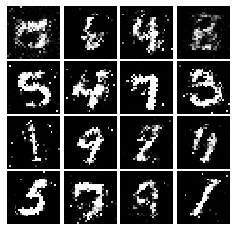

Epoch: 8, Iter: 4220, D: 0.2867, G:0.1696


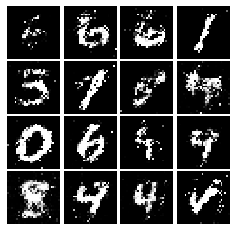

Epoch: 9, Iter: 4240, D: 0.2497, G:0.1432


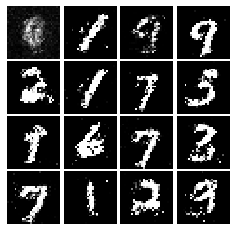

Epoch: 9, Iter: 4260, D: 0.237, G:0.1525


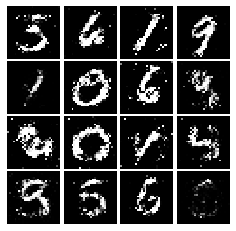

Epoch: 9, Iter: 4280, D: 0.2305, G:0.1722


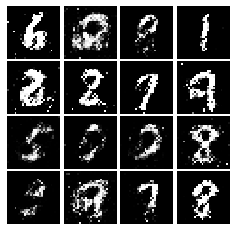

Epoch: 9, Iter: 4300, D: 0.2355, G:0.1614


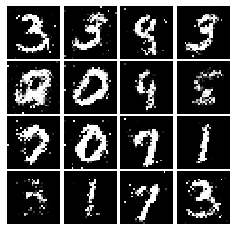

Epoch: 9, Iter: 4320, D: 0.247, G:0.1633


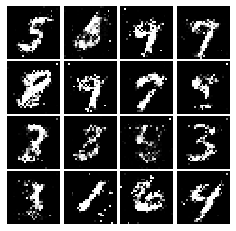

Epoch: 9, Iter: 4340, D: 0.2111, G:0.17


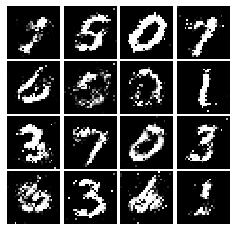

Epoch: 9, Iter: 4360, D: 0.2591, G:0.1198


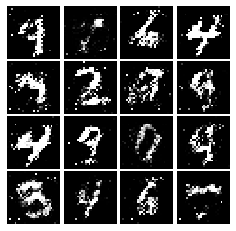

Epoch: 9, Iter: 4380, D: 0.2475, G:0.1638


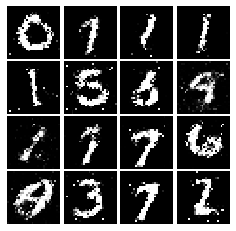

Epoch: 9, Iter: 4400, D: 0.2283, G:0.152


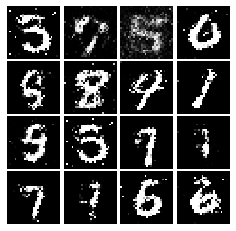

Epoch: 9, Iter: 4420, D: 0.2409, G:0.1569


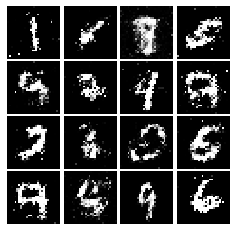

Epoch: 9, Iter: 4440, D: 0.2308, G:0.1498


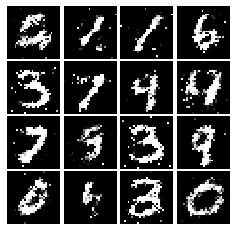

Epoch: 9, Iter: 4460, D: 0.2221, G:0.1503


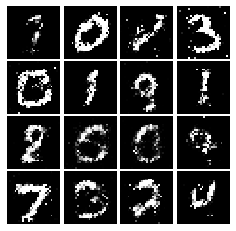

Epoch: 9, Iter: 4480, D: 0.2337, G:0.1603


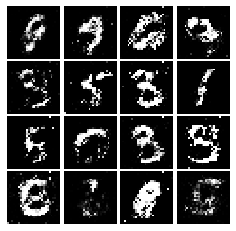

Epoch: 9, Iter: 4500, D: 0.2415, G:0.1472


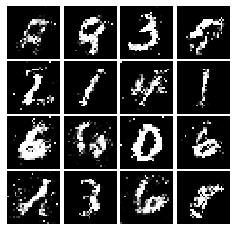

Epoch: 9, Iter: 4520, D: 0.2479, G:0.1826


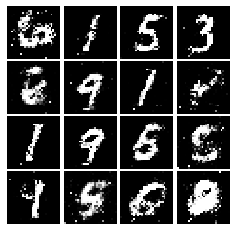

Epoch: 9, Iter: 4540, D: 0.2353, G:0.1529


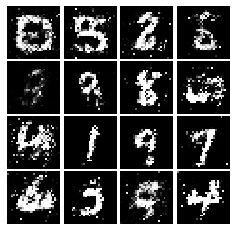

Epoch: 9, Iter: 4560, D: 0.2262, G:0.1557


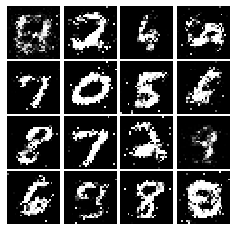

Epoch: 9, Iter: 4580, D: 0.2318, G:0.1407


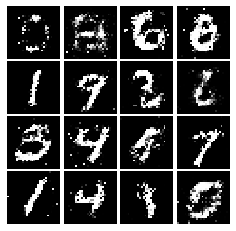

Epoch: 9, Iter: 4600, D: 0.2333, G:0.1594


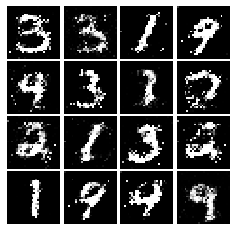

Epoch: 9, Iter: 4620, D: 0.2226, G:0.1672


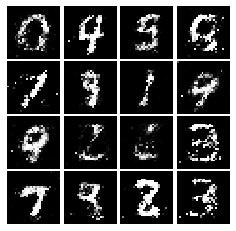

Epoch: 9, Iter: 4640, D: 0.2479, G:0.1657


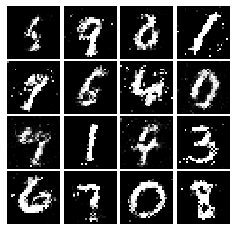

Epoch: 9, Iter: 4660, D: 0.2462, G:0.1714


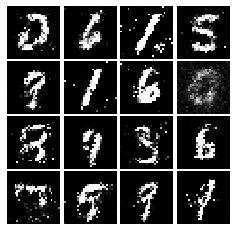

Epoch: 9, Iter: 4680, D: 0.2344, G:0.1541


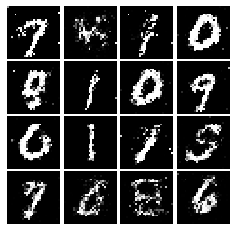

Final images


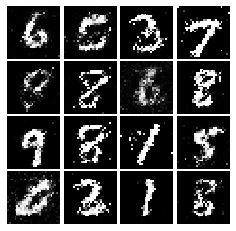

In [21]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, ls_discriminator_loss, ls_generator_loss)

# Deep Convolutional GANs
In the first part of the notebook, we implemented an almost direct copy of the original GAN network from Ian Goodfellow. However, this network architecture allows no real spatial reasoning. It is unable to reason about things like "sharp edges" in general because it lacks any convolutional layers. Thus, in this section, we will implement some of the ideas from [DCGAN](https://arxiv.org/abs/1511.06434), where we use convolutional networks as our discriminators and generators.

#### Discriminator
We will use a discriminator inspired by the TensorFlow MNIST classification [tutorial](https://www.tensorflow.org/get_started/mnist/pros), which is able to get above 99% accuracy on the MNIST dataset fairly quickly. *Be sure to check the dimensions of x and reshape when needed*, fully connected blocks expect [N,D] Tensors while conv2d blocks expect [N,H,W,C] Tensors. Please use `tf.keras.layers` to define the following architecture:

Architecture:
* Conv2D: 32 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Conv2D: 64 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Flatten
* Fully Connected with output size 4 x 4 x 64
* Leaky ReLU(alpha=0.01)
* Fully Connected with output size 1

Once again, please use biases for all convolutional and fully connected layers, and use the default parameter initializers. Note that a padding of 0 can be accomplished with the 'VALID' padding option.

In [22]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    from tensorflow.keras import layers
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        layers.Reshape((28, 28,1), input_shape=(784,)),
        layers.Conv2D(32, 5, strides=(1, 1), padding='valid', activation = leaky_relu),
        layers.MaxPool2D(pool_size=(2, 2), strides=2),
        layers.Conv2D(64, 5, strides=(1, 1), padding='valid', activation = leaky_relu),
        layers.MaxPool2D(pool_size=(2, 2), strides=2),
        layers.Flatten(),
        layers.Dense(4*4*64 ,activation = leaky_relu),
        layers.Dense(1)

        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

model = discriminator()
test_discriminator(1102721)

Correct number of parameters in discriminator.


#### Generator
For the generator, we will copy the architecture exactly from the [InfoGAN paper](https://arxiv.org/pdf/1606.03657.pdf). See Appendix C.1 MNIST. Please use `tf.keras.layers` for your implementation. You might find the documentation for [tf.keras.layers.Conv2DTranspose](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/layers/Conv2DTranspose) useful. The architecture is as follows.

Architecture:
* Fully connected with output size 1024 
* `ReLU`
* BatchNorm
* Fully connected with output size 7 x 7 x 128 
* `ReLU`
* BatchNorm
* Resize into Image Tensor of size 7, 7, 128
* Conv2D^T (transpose): 64 filters of 4x4, stride 2
* `ReLU`
* BatchNorm
* Conv2d^T (transpose): 1 filter of 4x4, stride 2
* `TanH`

Once again, use biases for the fully connected and transpose convolutional layers. Please use the default initializers for your parameters. For padding, choose the 'same' option for transpose convolutions. For Batch Normalization, assume we are always in 'training' mode.

In [23]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential()
    # TODO: implement architecture
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    from tensorflow.keras import layers
    model.add(layers.Dense(1024, input_shape=(noise_dim,), activation='relu'))
    model.add(layers.BatchNormalization())
    model.add(layers.Dense(7*7*128, activation='relu'))
    model.add(layers.BatchNormalization())
    model.add(layers.Reshape((7, 7, 128)))
    model.add(layers.Conv2DTranspose(64, 4, strides=(2, 2),padding='same',activation = 'relu'))
    model.add(layers.BatchNormalization())
    model.add(layers.Conv2DTranspose(1, 4, strides=(2, 2),padding='same',activation = 'tanh'))
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return model
test_generator(6595521)

Correct number of parameters in generator.


We have to recreate our network since we've changed our functions.

### Train and evaluate a DCGAN
This is the one part of A3 that significantly benefits from using a GPU. It takes 3 minutes on a GPU for the requested five epochs. Or about 50 minutes on a dual core laptop on CPU (feel free to use 3 epochs if you do it on CPU).

Epoch: 0, Iter: 0, D: 1.309, G:0.664


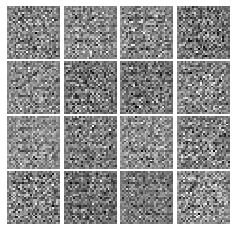

Epoch: 0, Iter: 20, D: 0.9883, G:0.1894


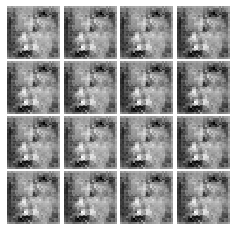

Epoch: 0, Iter: 40, D: 0.3435, G:2.315


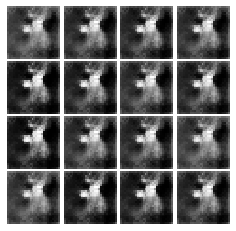

Epoch: 0, Iter: 60, D: 0.2958, G:3.201


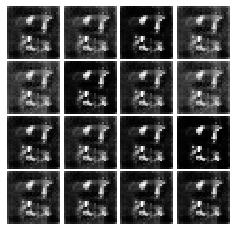

Epoch: 0, Iter: 80, D: 0.3161, G:3.441


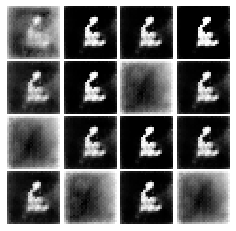

Epoch: 0, Iter: 100, D: 0.6607, G:4.927


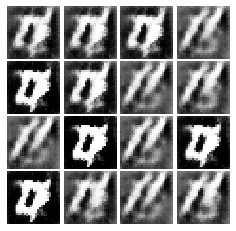

Epoch: 0, Iter: 120, D: 1.913, G:5.663


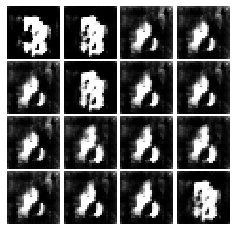

Epoch: 0, Iter: 140, D: 0.7716, G:1.622


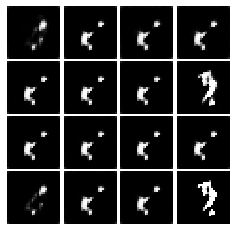

Epoch: 0, Iter: 160, D: 0.1654, G:4.209


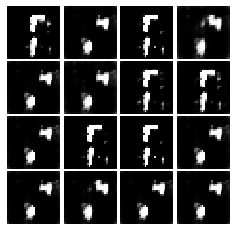

Epoch: 0, Iter: 180, D: 0.7918, G:1.672


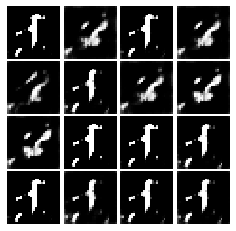

Epoch: 0, Iter: 200, D: 0.3671, G:2.775


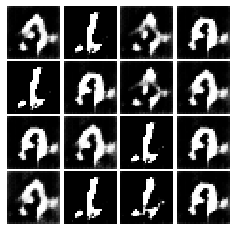

Epoch: 0, Iter: 220, D: 0.7379, G:1.047


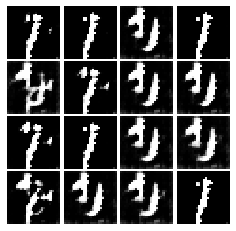

Epoch: 0, Iter: 240, D: 0.4628, G:1.849


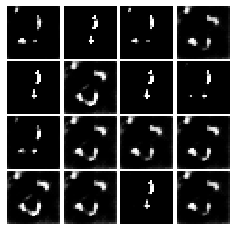

Epoch: 0, Iter: 260, D: 0.2788, G:3.117


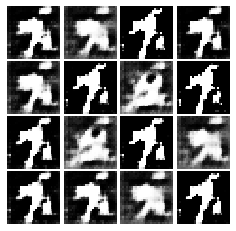

Epoch: 0, Iter: 280, D: 0.3405, G:2.914


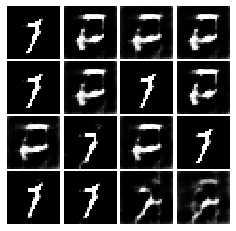

Epoch: 0, Iter: 300, D: 0.6446, G:1.94


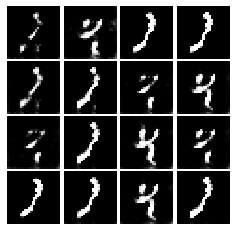

Epoch: 0, Iter: 320, D: 0.4565, G:3.047


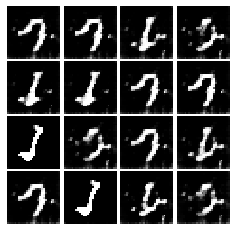

Epoch: 0, Iter: 340, D: 0.1086, G:4.159


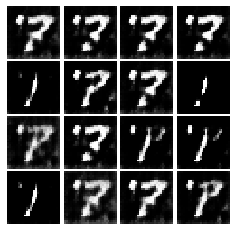

Epoch: 0, Iter: 360, D: 0.5941, G:2.511


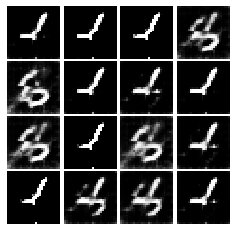

Epoch: 0, Iter: 380, D: 0.3894, G:3.433


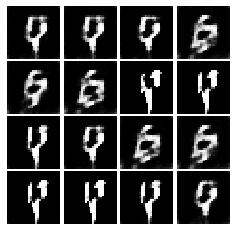

Epoch: 0, Iter: 400, D: 0.5075, G:7.101


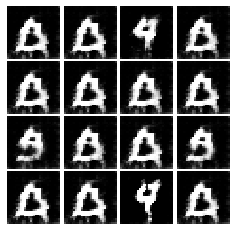

Epoch: 0, Iter: 420, D: 0.1172, G:4.089


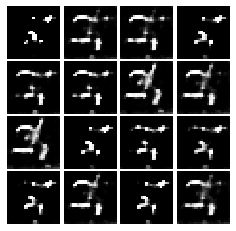

Epoch: 0, Iter: 440, D: 0.1469, G:3.141


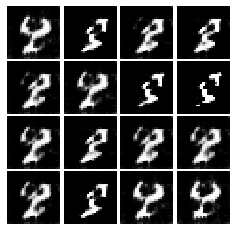

Epoch: 0, Iter: 460, D: 0.3331, G:3.101


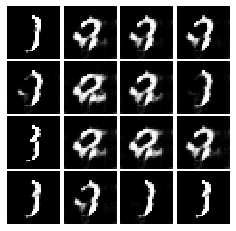

Epoch: 1, Iter: 480, D: 0.3854, G:4.136


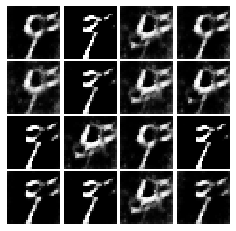

Epoch: 1, Iter: 500, D: 0.6394, G:7.096


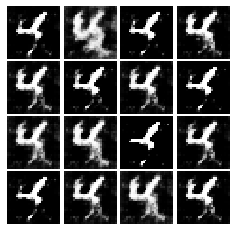

Epoch: 1, Iter: 520, D: 0.6037, G:6.771


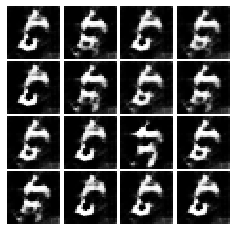

Epoch: 1, Iter: 540, D: 0.3742, G:2.781


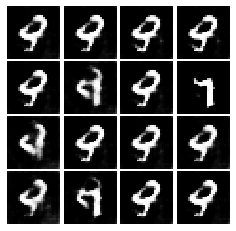

Epoch: 1, Iter: 560, D: 0.5081, G:2.145


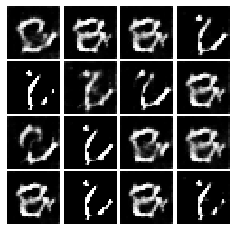

Epoch: 1, Iter: 580, D: 0.609, G:2.264


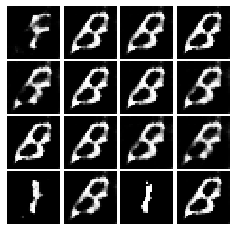

Epoch: 1, Iter: 600, D: 0.3731, G:2.872


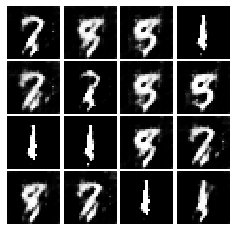

Epoch: 1, Iter: 620, D: 0.2398, G:3.218


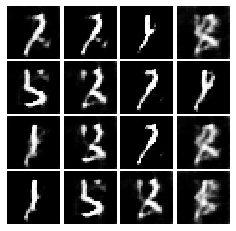

Epoch: 1, Iter: 640, D: 0.5439, G:3.133


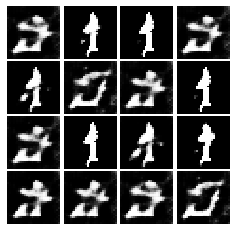

Epoch: 1, Iter: 660, D: 0.1885, G:4.124


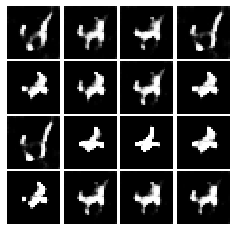

Epoch: 1, Iter: 680, D: 0.4073, G:4.775


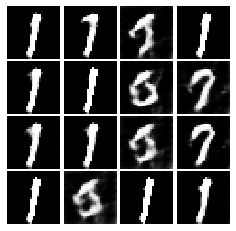

Epoch: 1, Iter: 700, D: 0.3538, G:3.463


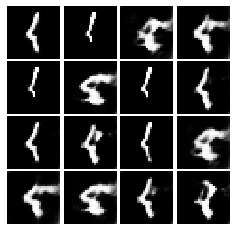

Epoch: 1, Iter: 720, D: 0.6759, G:5.629


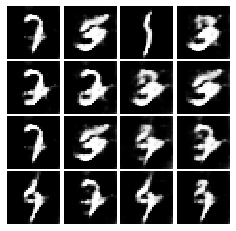

Epoch: 1, Iter: 740, D: 0.5162, G:2.503


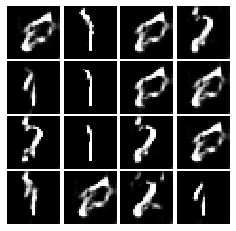

Epoch: 1, Iter: 760, D: 0.2599, G:4.377


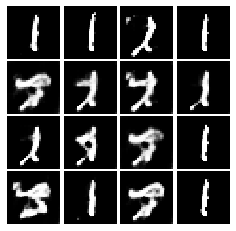

Epoch: 1, Iter: 780, D: 0.3331, G:2.465


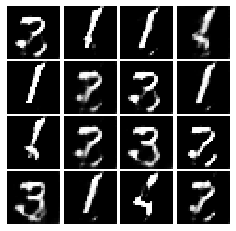

Epoch: 1, Iter: 800, D: 0.4145, G:3.341


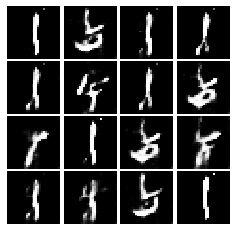

Epoch: 1, Iter: 820, D: 0.4925, G:2.817


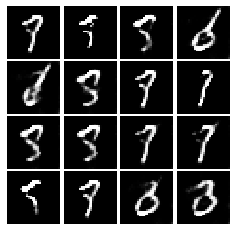

Epoch: 1, Iter: 840, D: 0.5278, G:3.483


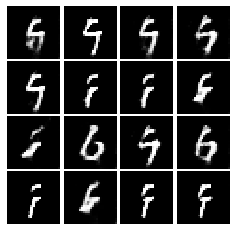

Epoch: 1, Iter: 860, D: 0.4879, G:2.325


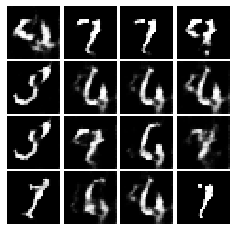

Epoch: 1, Iter: 880, D: 0.3658, G:2.716


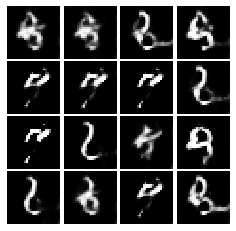

Epoch: 1, Iter: 900, D: 0.3736, G:3.488


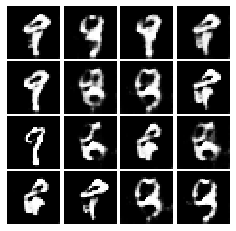

Epoch: 1, Iter: 920, D: 0.2332, G:3.464


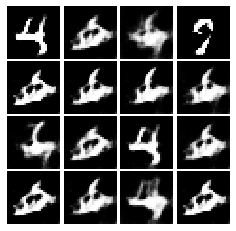

Epoch: 2, Iter: 940, D: 0.6258, G:4.065


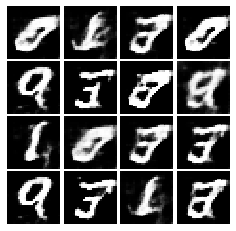

Epoch: 2, Iter: 960, D: 0.6352, G:2.811


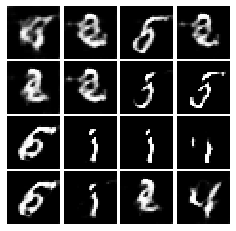

Epoch: 2, Iter: 980, D: 2.559, G:3.429


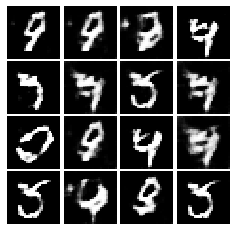

Epoch: 2, Iter: 1000, D: 0.6048, G:2.559


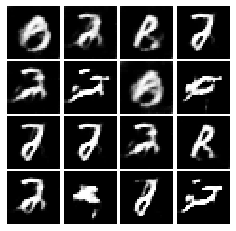

Epoch: 2, Iter: 1020, D: 0.3807, G:3.441


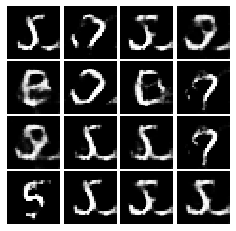

Epoch: 2, Iter: 1040, D: 0.5696, G:2.663


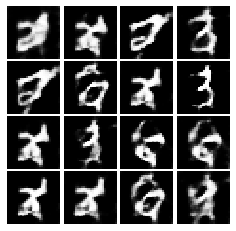

Epoch: 2, Iter: 1060, D: 0.1768, G:3.761


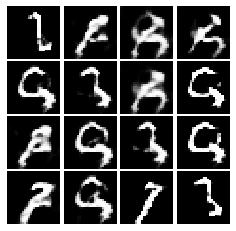

Epoch: 2, Iter: 1080, D: 0.2869, G:2.741


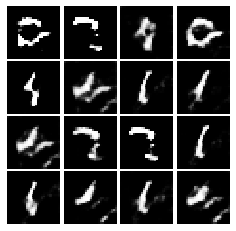

Epoch: 2, Iter: 1100, D: 0.5916, G:4.257


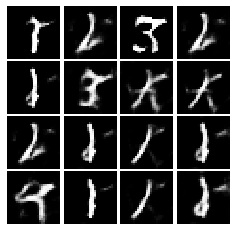

Epoch: 2, Iter: 1120, D: 0.4582, G:2.277


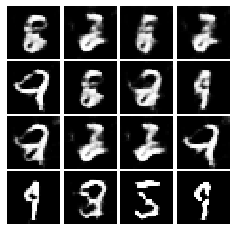

Epoch: 2, Iter: 1140, D: 0.4251, G:3.061


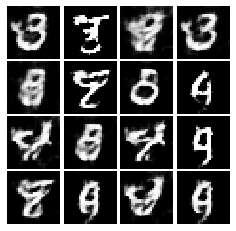

Epoch: 2, Iter: 1160, D: 0.6551, G:2.463


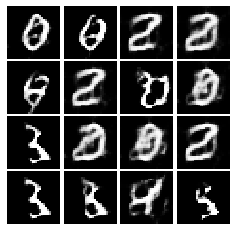

Epoch: 2, Iter: 1180, D: 3.69, G:1.53


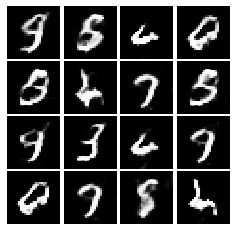

Epoch: 2, Iter: 1200, D: 0.5894, G:3.079


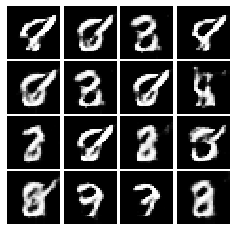

Epoch: 2, Iter: 1220, D: 1.068, G:1.646


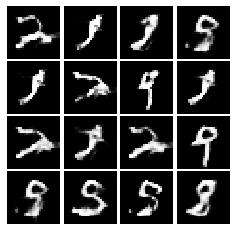

Epoch: 2, Iter: 1240, D: 0.462, G:2.421


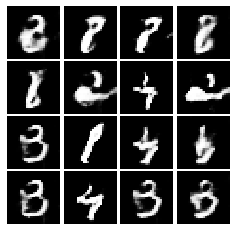

Epoch: 2, Iter: 1260, D: 0.6832, G:2.317


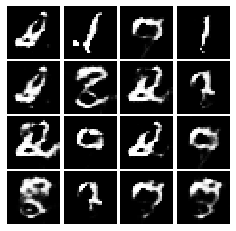

Epoch: 2, Iter: 1280, D: 0.7019, G:3.966


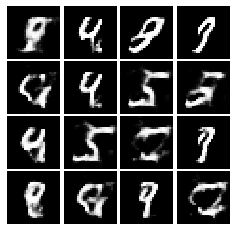

Epoch: 2, Iter: 1300, D: 0.4199, G:2.704


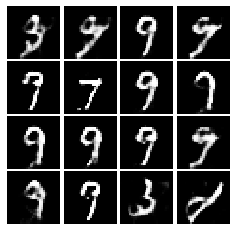

Epoch: 2, Iter: 1320, D: 0.4519, G:2.76


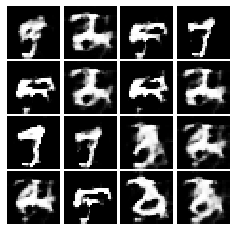

Epoch: 2, Iter: 1340, D: 0.315, G:3.114


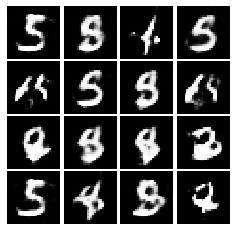

Epoch: 2, Iter: 1360, D: 0.3903, G:2.858


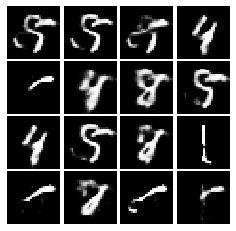

Epoch: 2, Iter: 1380, D: 0.4277, G:3.611


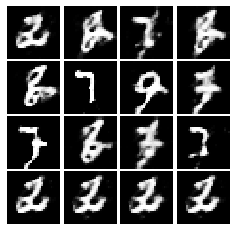

Epoch: 2, Iter: 1400, D: 0.3085, G:4.244


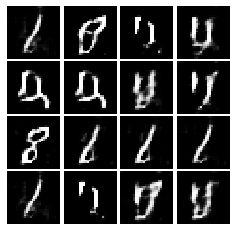

Epoch: 3, Iter: 1420, D: 0.3556, G:2.842


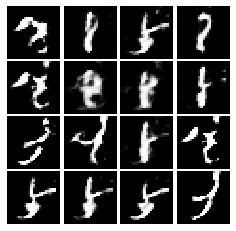

Epoch: 3, Iter: 1440, D: 0.3605, G:2.972


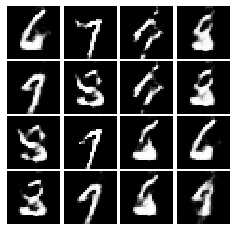

Epoch: 3, Iter: 1460, D: 0.6175, G:3.113


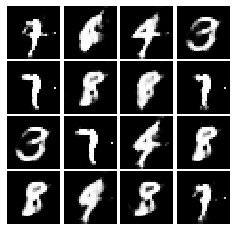

Epoch: 3, Iter: 1480, D: 0.333, G:3.046


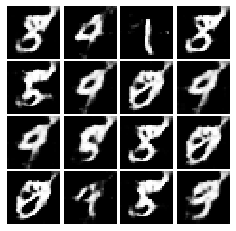

Epoch: 3, Iter: 1500, D: 0.2945, G:2.696


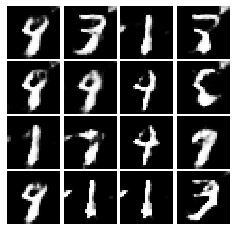

Epoch: 3, Iter: 1520, D: 0.3785, G:3.12


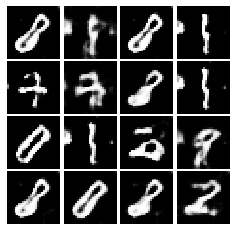

Epoch: 3, Iter: 1540, D: 0.5337, G:4.724


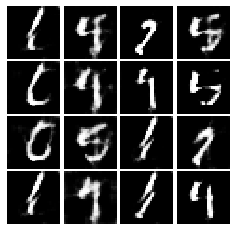

Epoch: 3, Iter: 1560, D: 0.3705, G:2.14


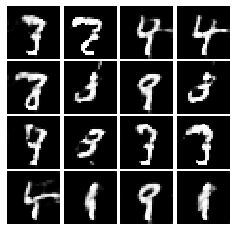

Epoch: 3, Iter: 1580, D: 0.2477, G:2.833


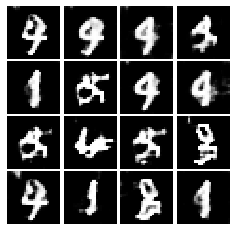

Epoch: 3, Iter: 1600, D: 0.4096, G:5.211


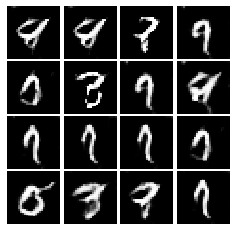

Epoch: 3, Iter: 1620, D: 0.4855, G:2.366


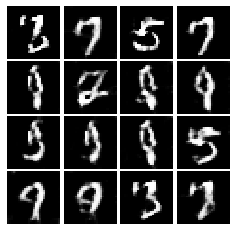

Epoch: 3, Iter: 1640, D: 0.3659, G:2.778


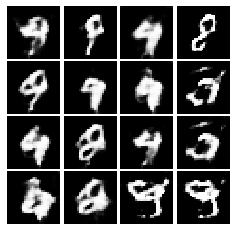

Epoch: 3, Iter: 1660, D: 0.3142, G:2.003


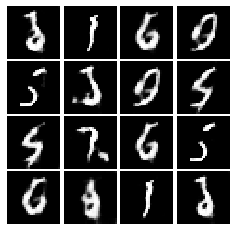

Epoch: 3, Iter: 1680, D: 0.5996, G:4.359


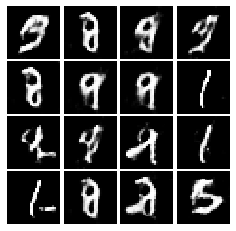

Epoch: 3, Iter: 1700, D: 0.4896, G:3.269


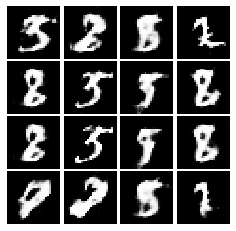

Epoch: 3, Iter: 1720, D: 0.4267, G:2.738


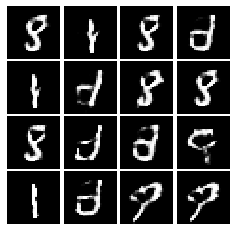

Epoch: 3, Iter: 1740, D: 0.3917, G:2.696


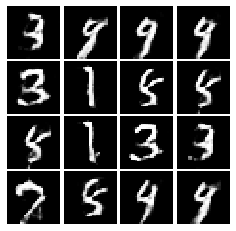

Epoch: 3, Iter: 1760, D: 0.509, G:3.251


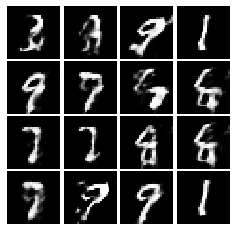

Epoch: 3, Iter: 1780, D: 0.4224, G:3.014


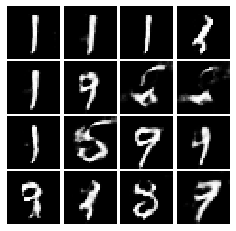

Epoch: 3, Iter: 1800, D: 0.4532, G:2.47


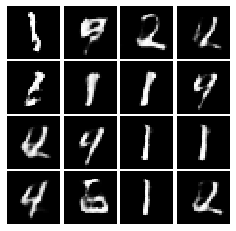

Epoch: 3, Iter: 1820, D: 0.4683, G:2.888


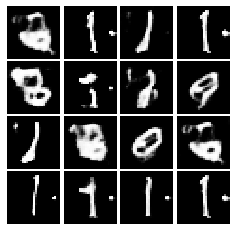

Epoch: 3, Iter: 1840, D: 0.4801, G:3.627


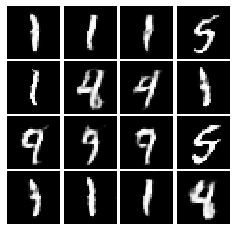

Epoch: 3, Iter: 1860, D: 0.3266, G:3.333


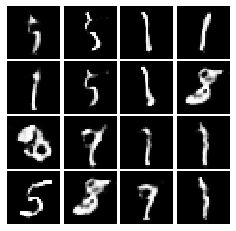

Epoch: 4, Iter: 1880, D: 0.3023, G:2.671


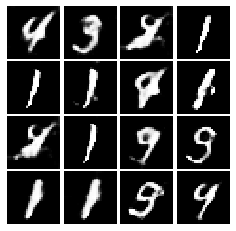

Epoch: 4, Iter: 1900, D: 0.4626, G:2.642


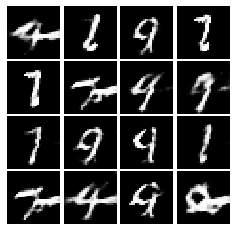

Epoch: 4, Iter: 1920, D: 0.2816, G:3.134


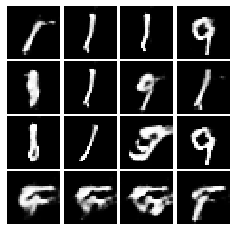

Epoch: 4, Iter: 1940, D: 0.3193, G:2.695


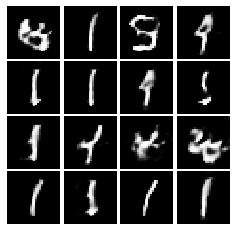

Epoch: 4, Iter: 1960, D: 0.4536, G:2.511


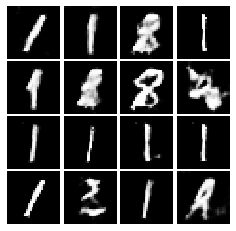

Epoch: 4, Iter: 1980, D: 0.3221, G:3.34


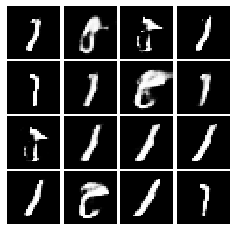

Epoch: 4, Iter: 2000, D: 0.7289, G:1.667


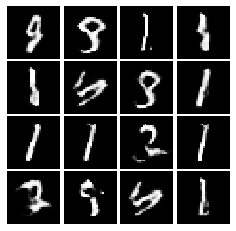

Epoch: 4, Iter: 2020, D: 0.536, G:2.496


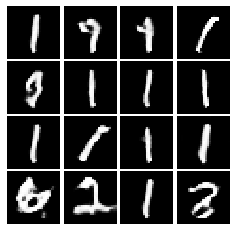

Epoch: 4, Iter: 2040, D: 0.4342, G:2.559


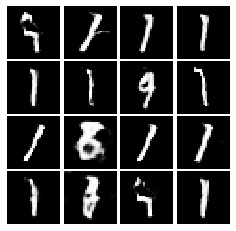

Epoch: 4, Iter: 2060, D: 0.3901, G:2.344


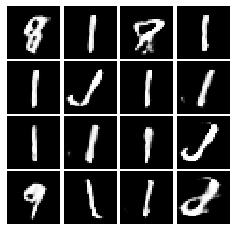

Epoch: 4, Iter: 2080, D: 0.6067, G:2.128


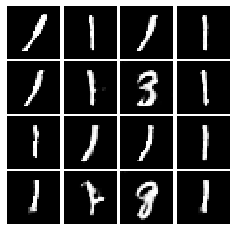

Epoch: 4, Iter: 2100, D: 0.4153, G:2.763


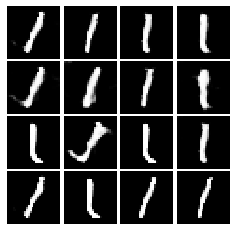

Epoch: 4, Iter: 2120, D: 0.5695, G:2.583


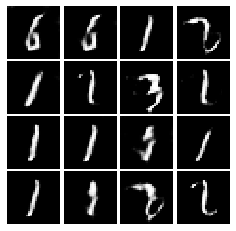

Epoch: 4, Iter: 2140, D: 0.4943, G:2.095


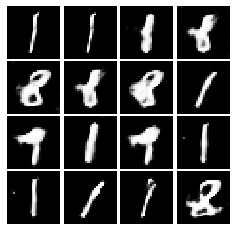

Epoch: 4, Iter: 2160, D: 0.5347, G:2.428


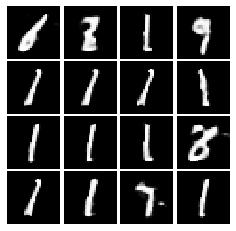

Epoch: 4, Iter: 2180, D: 0.3466, G:2.774


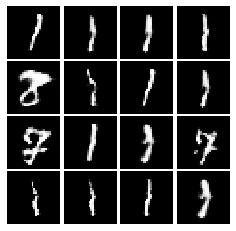

Epoch: 4, Iter: 2200, D: 0.4811, G:2.43


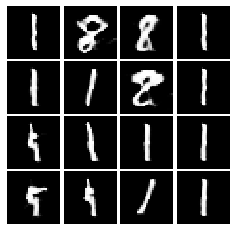

Epoch: 4, Iter: 2220, D: 0.4288, G:2.346


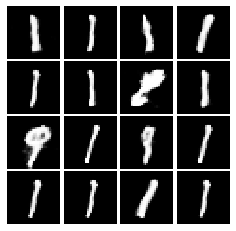

Epoch: 4, Iter: 2240, D: 0.3106, G:2.954


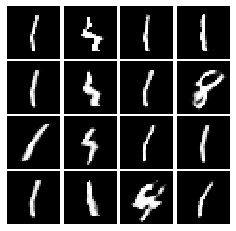

Epoch: 4, Iter: 2260, D: 0.3166, G:2.735


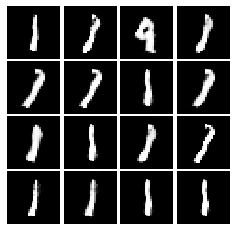

Epoch: 4, Iter: 2280, D: 0.3948, G:2.472


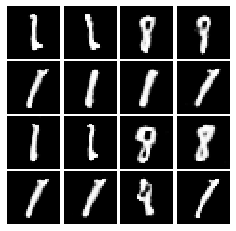

Epoch: 4, Iter: 2300, D: 0.3726, G:2.358


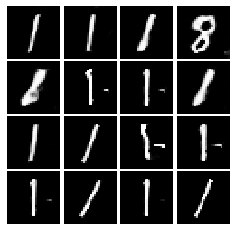

Epoch: 4, Iter: 2320, D: 0.3804, G:2.527


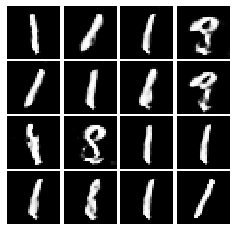

Epoch: 4, Iter: 2340, D: 0.3944, G:2.695


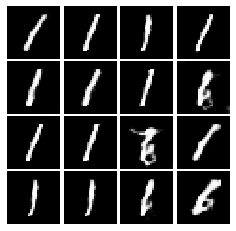

Final images


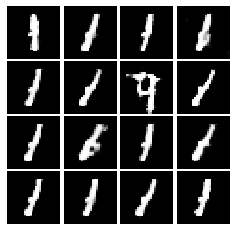

In [24]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss, num_epochs=5)